# Imports and Setup

In [1]:
import sklearn
import cv2 as cv
import glob
from sklearn.cluster import KMeans
from functools import partial
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import numpy.ma as ma
import pandas as pd
import time as Timing

In [2]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

ModuleNotFoundError: No module named 'google.colab'

In [3]:
PATH = "drive/My Drive/rPPG/"

In [2]:
PATH = "rPPG/"

# Per-Frame Experimentation

## Helper Functions and Loading Test Images

In [5]:
images = [cv.imread(file, cv.IMREAD_UNCHANGED) for file in glob.glob(PATH + "test-roi-images/*.jpg")]
# images = images[:5]

In [6]:
#Based on https://gist.github.com/soply/f3eec2e79c165e39c9d540e916142ae1
def show_images_plt(images):
  cols = 1
  fig = plt.figure()
  for n, image in enumerate(images):
    a = fig.add_subplot(cols, np.ceil(len(images)/float(cols)), n + 1)
    plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
    plt.axis("off")
  fig.set_size_inches(1.1*np.array(fig.get_size_inches()) * len(images))
  plt.show()

In [7]:
def show_images_cv2(images):
  for image in images:
    cv2_imshow(image)

In [8]:
def get_faces_cropped(detector, image):
  cropped_images = []
  for (x, y, w, h) in detector(image):
    cropped_images.append(image[y:y+h, x:x+w])
  return cropped_images

In [9]:
def crop_multiple_images(images, detector):
  return [cropped for image in images for cropped in get_faces_cropped(detector, image)]

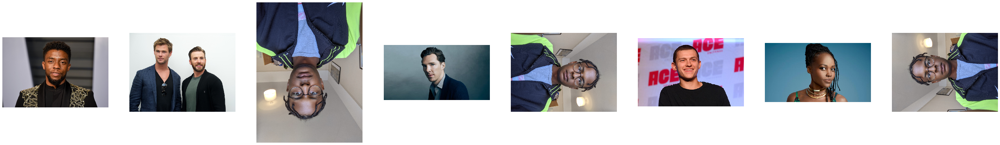

In [10]:
show_images_plt(images)

## Face Detection


In [11]:
MODEL_PATH = PATH + "models/"

### Haar Cascades

In [1]:
faceCascade = cv.CascadeClassifier(cv.data.haarcascades + "haarcascade_frontalface_default.xml")
# or faceCascade = cv.CascadeClassifier(f'{MODEL_PATH}/haar/haarcascade_frontalface_default.xml')

NameError: name 'cv' is not defined

In [2]:
def haar_detector(image):
  cropped_images = []
  gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
  faces = faceCascade.detectMultiScale(
    gray,
    scaleFactor=1.05,
    minNeighbors=5,
    minSize=(1,1),
    flags = cv.CASCADE_SCALE_IMAGE
  )
  return faces

In [ ]:
img = images[0].copy()
face = haar_detector(img)[0]
print(type(face))
x1,y1,x2,y2 = face
cv.rectangle(img, (x1,y1),(x1+x2,y1+y2), (0, 255, 0), 2)
cv2_imshow(img)

NameError: ignored

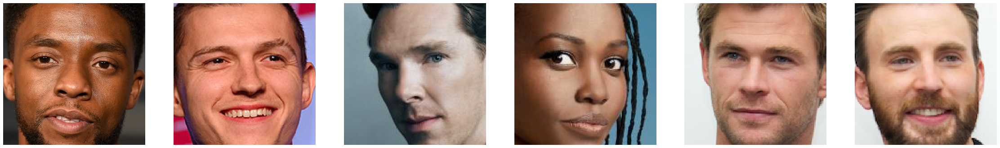

In [ ]:
cropped = crop_multiple_images(images, haar_detector)
show_images_plt(cropped)

### MTCNN

In [ ]:
!pip install facenet-pytorch
from facenet_pytorch import MTCNN, InceptionResnetV1
from numpy import asarray
from PIL import Image

     |████████████████████████████████| 1.9MB 3.4MB/s 


In [ ]:
mtcnn = MTCNN(keep_all=True)
def mtcnn_detector(image):
  image = Image.fromarray(image)
  faces,_ = mtcnn.detect(image)
  if faces is None:
    faces = []
  return [(int(x1), int(y1), int(x2-x1), int(y2-y1)) for (x1,y1,x2,y2) in faces]

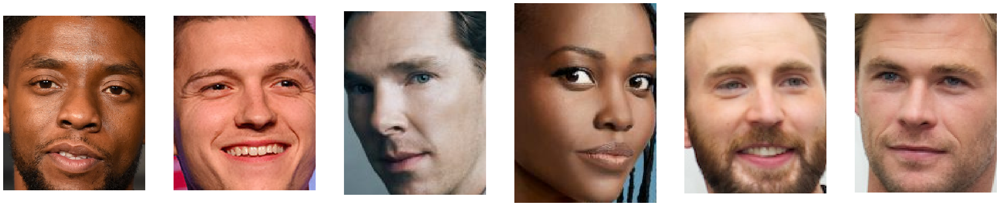

In [ ]:
cropped = crop_multiple_images(images, mtcnn_detector)
show_images_plt(cropped)

### DNN

In [12]:
modelFile = MODEL_PATH + "opencv_face_detector_uint8.pb"
configFile = MODEL_PATH + "opencv_face_detector.pbtxt"
dnn = cv.dnn.readNetFromTensorflow(modelFile, configFile)

In [13]:
def dnn_detector(image):
  faces = []
  blob = cv.dnn.blobFromImage(image, 1.0, (300, 300), [104, 117, 123], False, False)
  h,w,_ = image.shape
  dnn.setInput(blob)
  detections = dnn.forward()
  bboxes = []
  for i in range(detections.shape[2]):
      confidence = detections[0, 0, i, 2]
      if confidence > 0.5:
          x1 = int(detections[0, 0, i, 3] * w)
          y1 = int(detections[0, 0, i, 4] * h)
          x2 = int(detections[0, 0, i, 5] * w)
          y2 = int(detections[0, 0, i, 6] * h)
          faces.append((x1,y1,x2-x1,y2-y1))
      
  return faces
    

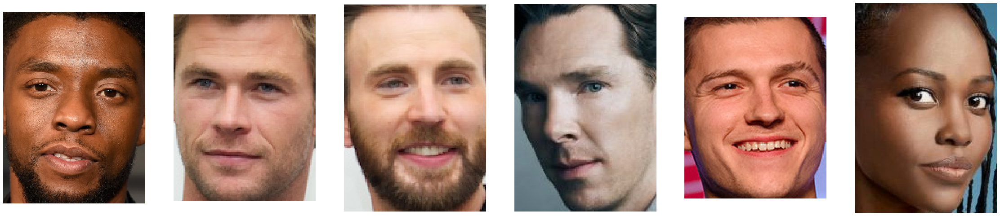

In [14]:
cropped = crop_multiple_images(images, dnn_detector)
show_images_plt(cropped)

### DLib

In [ ]:
!pip install dlib
import dlib

#### HoG

In [ ]:
def dlib_hog_detector(image):
  detector = dlib.get_frontal_face_detector()
  faces = detector(image,0)
  return [(f.left(), f.top(), f.right()-f.left(), f.bottom()-f.top()) for f in faces]

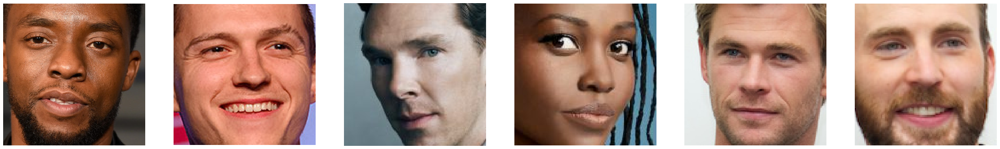

In [ ]:
cropped = crop_multiple_images(images, dlib_hog_detector)
show_images_plt(cropped)

#### MMOD [Archived]


In [ ]:
path = MODEL_PATH + "dlib/mmod_human_face_detector.dat"
def dlib_mmod_detector(image):
  detector = dlib.cnn_face_detection_model_v1(path)
  faces = detector(image, 0)
  return [(f.left(), f.top(), f.right()-f.left(), f.bottom()-f.top()) for f in faces]

In [ ]:
cropped = crop_multiple_images(images, dlib_mmod_detector)
show_images_plt(cropped)

RuntimeError: ignored

#### Landmarks

In [ ]:
LANDMARK_5_PATH = MODEL_PATH + "/dlib/shape_predictor_5_face_landmarks.dat"
LANDMARK_68_PATH = MODEL_PATH + "/dlib/shape_predictor_68_face_landmarks.dat"
def dlib_landmark_detector(image, faces, five_landmarks=True):
  """
  Expects a whole frame and boxes bounding the faces in the image
  """
  predictor = dlib.shape_predictor(LANDMARK_5_PATH if five_landmarks else LANDMARK_68_PATH)
  for (x,y,w,h) in faces:
    shape = predictor(image, dlib.rectangle(left = x, top = y, right = x+w, bottom = y+h))
    for p in shape.parts():
      cv.circle(image,(p.x,p.y),3,255,-1)
  return image

In [ ]:
show_images_plt([dlib_landmark_detector(i.copy(), mtcnn_detector(i), True) for i in images])
show_images_plt([dlib_landmark_detector(i.copy(), mtcnn_detector(i), False) for i in images])

### PCN

In [ ]:
!apt install -y caffe-cpu

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  caffe-tools-cpu cython3 fonts-lyx javascript-common libblosc1 libcaffe-cpu1
  libgflags2.2 libgoogle-glog0v5 libjs-jquery-ui libleveldb1v5 liblmdb0
  python-matplotlib-data python-tables-data python3-bs4 python3-caffe-cpu
  python3-chardet python3-cycler python3-dateutil python3-decorator
  python3-gflags python3-h5py python3-html5lib python3-ipython
  python3-ipython-genutils python3-leveldb python3-lxml python3-matplotlib
  python3-networkx python3-nose python3-numexpr python3-olefile python3-pandas
  python3-pandas-lib python3-pexpect python3-pickleshare python3-pil
  python3-pkg-resources python3-prompt-toolkit python3-protobuf
  python3-ptyprocess python3-pygments python3-pyparsing python3-pywt
  python3-scipy python3-simplegeneric python3-six python3-skimage
  python3-skimage-lib python3-tables python3-tables-lib python3-traitlets


In [ ]:
## https://github.com/daixiangzi/Caffe-PCN/blob/master/pcn_caffe.py
import numpy as np
import cv2
import caffe
import math
import time

EPS = 1e-5
M_PI = 3.14159265358979323846
class PCN:
    def __init__(self):
        self.minface=""
        self.factor = ""
        self.scale =""
        self.stride = 8
        self.anglerange = 45
        self.augscale = 0.15
        self.thresh1 = 0.37
        self.thresh2 = 0.43
        self.thresh3 = 0.97
        self.nms_thresh1=0.8
        self.nms_thresh2 = 0.8
        self.nms_thresh3 = 0.3
        self.angle_range=45
        self.prelist = []
    def setmin_facesize(self,minfaces):
        minfaces = minfaces if minfaces>20 else 20
        minfaces *=1.4
        self.minface = minfaces
    def setimage_pyramidscalefactor(self,factors):
        self.scale = factors

    def legal(self,x, y, img):
        r, c, _ = img.shape
        if x >= 0 and x < c and y > 0 and y < r:
            return True
        else:
            return False
    def trans_windows(self,img,imgpad,winlist):#winlist:x,y,w,h,angle,scale,conf
        r = (imgpad.shape[0]-img.shape[0])/2
        c = (imgpad.shape[1]-img.shape[1])/2
        ret = []
        for i in range(len(winlist)):
            if winlist[i][2]>0 and winlist[i][3]>0:
                ret.append([winlist[i][0]-c,winlist[i][1]-r,winlist[i][3],winlist[i][4],winlist[i][6]])
        return ret
    def smooth_windows(self,winlist):
        for i in range(len(winlist)):
            for j in range(len(self.prelist)):
                if iou(winlist[i],self.prelist[j])>0.9:
                    winlist[i][5]=(winlist[i][5]+self.prelist[i][5])/2
                    winlist[i][0] = self.prelist[j][0]
                    winlist[i][1] = self.prelist[j][1]
                    winlist[i][2] = self.prelist[j][2]
                    winlist[i][3] = self.prelist[j][3]
                    winlist[i][4] = self.prelist[j][4]
                elif iou(winlist[i],self.prelist[j])>0.6:
                    winlist[i][5]=(winlist[i][5]+self.prelist[i][5])/2
                    winlist[i][0] = (self.pprelist[j][0]+winlist[j][0])/2
                    winlist[i][1] = (self.prelist[j][1]+winlist[j][1])/2
                    winlist[i][2] = (self.prelist[j][2]+winlist[j][2])/2
                    winlist[i][3] = (self.prelist[j][3]+winlist[j][3])/2
                    winlist[i][4] = smoothangle(winlist[j][4],self.prelist[j][4])
        prelist = winlist
        return winlist

    def stage1(self, img, imgpad, net, thres):
        r, c, _ = img.shape
        r_pad, c_pad, _ = imgpad.shape
        real_c = (c_pad - c) / 2
        real_r = (r_pad - r) / 2
        netsize = 24
        winlist = []
        curscale = self.minface/float(netsize)
        img_resize = resize_img(img,curscale)
        while min(img_resize.shape[0],img_resize.shape[1])>=netsize:
            prob,rotate_prob,reg = setinput(preprocess_img(img_resize),net,1)
            _,__,prob_h,prob_w= prob.shape
            w = netsize*curscale
            for i in range(prob_h):
                    for j in range(prob_w):
                        if prob[0,1,i,j]>thres:
                            sn = reg[0,0,i,j]
                            xn = reg[0,1,i,j]
                            yn = reg[0,2,i,j]
                            rx = int(j*curscale*self.stride-0.5*sn*w+sn*xn*w+0.5*w)+real_c
                            ry = int(i*curscale*self.stride-0.5*sn*w+sn*yn*w+0.5*w)+real_r
                            rw = int(w*sn)
                            if self.legal(rx,ry,imgpad) and self.legal(rx+rw-1,ry+rw-1,imgpad):
                                if rotate_prob[0,1,i,j]>0.5:
                                    winlist.append([rx,ry,rw,rw,0,curscale,prob[0,1,i,j]])
                                else:
                                    winlist.append([rx, ry, rw, rw, 180, curscale, prob[0, 1, i, j]])
            img_resize = resize_img(img_resize,self.scale)
            curscale = float(r)/(img_resize.shape[0])
        return winlist

    def stage2(self, img, img180, net, thres,dim,winlist):
        if len(winlist)==0:
            return winlist
        winlist = np.array(winlist)
        datalist=[]
        h = img.shape[0]
        for i in range(len(winlist)):
            if abs(winlist[i][4])<EPS:
                crop_img = img[int(winlist[i][1]):int(winlist[i][1]+winlist[i][3]),int(winlist[i][0]):int(winlist[i][0]+winlist[i][2])]
                datalist.append(preprocess_img(crop_img,dim))
            else:
                y2 = winlist[i][1] + winlist[i][3] - 1
                crop_img = img180[int(h-1-y2):int(winlist[i][3]+h-1-y2),int(winlist[i][0]):int(winlist[i][0]+winlist[i][2])]
                datalist.append(preprocess_img(crop_img, dim))
        datalist = np.array(datalist)
        prob, rotate_prob, reg = setinput(datalist, net,2)
        ret =[]
        for i in range(len(winlist)):
            if prob[i,1]>thres:
                sn = reg[i,0]
                xn =reg[i,1]
                yn = reg[i,2]
                cropx = winlist[i][0]
                cropy = winlist[i][1]
                cropw = winlist[i][2]
                if abs(winlist[i][4])>EPS:
                    cropy = h - 1-(cropy+cropw-1)
                w = int(sn*cropw)
                x = int(cropx-0.5*sn*cropw+cropw*sn*xn+0.5*cropw)
                y = int(cropy-0.5*sn*cropw+cropw*sn*yn+0.5*cropw)
                maxRotatescore = 0
                maxRotateindex = 0
                for j in range(3):
                    if rotate_prob[i,j]>maxRotatescore:
                        maxRotatescore = rotate_prob[i,j]
                        maxRotateindex = j
                if self.legal(x,y,img) and self.legal(x+w-1,y+w-1,img):
                    angle =0
                    if abs(winlist[i][4])<EPS:
                        if maxRotateindex ==0:
                            angle = 90
                        elif maxRotateindex == 1:
                            angle = 0
                        else:
                            angle = -90
                        ret.append([x,y,w,w,angle,winlist[i][5],prob[i,1]])
                    else:
                    	if maxRotateindex==0:
                        	angle=90
                    	elif maxRotateindex==1:
                        	angle = 180
                    	else:
                        	angle = -90
                    	ret.append([x,h-1-(y+w-1),w,w,angle,winlist[i][5],prob[i,1]])
        return ret

    def stage3(self,img,img180,img90,img_neg90,net,thres,dim, winlist):
        if len(winlist)==0:
            return winlist
        datalist=[]
        h,width,_ = img.shape
        for i in range(len(winlist)):#0:x,y:1,w:2,h:3
            if abs(winlist[i][4])<EPS:
                temp_img = img[winlist[i][1]:winlist[i][1]+winlist[i][3],winlist[i][0]:winlist[i][0]+winlist[i][2]]
                datalist.append(preprocess_img(temp_img,dim))
            elif abs(winlist[i][4]-90)<EPS:
                temp_img = img90[winlist[i][0]:winlist[i][0] + winlist[i][2], winlist[i][1]:winlist[i][1] + winlist[i][3]]
                datalist.append(preprocess_img(temp_img, dim))
            elif abs(winlist[i][4]+90) < EPS:
                x = winlist[i][1]
                y = width-1-(winlist[i][0]+winlist[i][2]-1)
                temp_img = img_neg90[y:y+winlist[i][3],x:x+winlist[i][2]]

                datalist.append(preprocess_img(temp_img, dim))
            else:
                y2 = winlist[i][1]+winlist[i][3]-1
                y = h -1-y2
                temp_img = img180[y:y + winlist[i][3], winlist[i][0]:winlist[i][0]+ winlist[i][2]]
                datalist.append(preprocess_img(temp_img, dim))
        datalist = np.array(datalist)
        prob, rotate_prob, reg = setinput(datalist, net,3)
        ret =[]
        for i in range(len(winlist)):
            if prob[i][1]>thres:
                img_tmp = img
                sn = reg[i][0]
                xn = reg[i][1]
                yn = reg[i][2]
                cropx = winlist[i][0]
                cropy = winlist[i][1]
                cropw = winlist[i][2]
                if abs(winlist[i][4]-180)<EPS:
                    cropy = h -1 -(cropy+cropw-1)
                    img_tmp = img180
                elif abs(winlist[i][4] - 90) < EPS:
                    cropy,cropx = cropx, cropy
                    img_tmp = img90
                elif abs(winlist[i][4] + 90) < EPS:
                    cropx = winlist[i][1]
                    cropy = width - 1 - (winlist[i][0] + winlist[i][2]-1)
                    img_tmp = img_neg90
                w = int(sn*cropw)
                x = int(cropx-0.5*sn*cropw+cropw*sn*xn+0.5*cropw)
                y = int(cropy-0.5*sn*cropw+cropw*sn*yn+0.5*cropw)
                angle = self.angle_range*rotate_prob[i][0]
                if legal(x,y,img_tmp) and legal(x+w-1,y+w-1,img_tmp):
                    if abs(winlist[i][4])<EPS:
                        ret.append([x,y,w,w,angle,winlist[i][5],prob[i][1]])
                    elif abs(winlist[i][4]-180)<EPS:
                        ret.append([x,h-1-(y+w-1),w,w,180-angle,winlist[i][5],prob[i][1]])
                    elif abs(winlist[i][4]-90)<EPS:
                        ret.append([y,x,w,w,90-angle,winlist[i][5],prob[i][1]])
                    else:
                        ret.append([width-y-w,x,w,w,angle-90,winlist[i][5],prob[i][1]])
        return ret

    def detect(self,img,imgpad,net):
        img180 = cv2.flip(imgpad,0)
        img90 = cv2.transpose(imgpad)
        img_neg90 = cv2.flip(img90,0)
        winlist = self.stage1(img,imgpad,net[0],self.thresh1)
        winlist = nms(winlist,True,self.nms_thresh1)

        winlist = self.stage2(imgpad,img180,net[1],self.thresh2,24,winlist)
        winlist = nms(winlist,True,self.nms_thresh2)

        winlist = self.stage3(imgpad,img180,img90,img_neg90,net[2],self.thresh3,48,winlist)
        winlist = nms(winlist,False,self.nms_thresh3)
        winlist = FP(winlist)
        return winlist
    def pcn_detect(self,img,net):
        imgpad = pad_img(img)
        winlist = self.detect(img,imgpad,net)
        return self.trans_windows(img,imgpad,winlist)


def pad_img(img):
        r,c,_ = img.shape
        r = min(int(r*0.2),100)
        c = min(int(c*0.2),100)
        ret = cv2.copyMakeBorder(img,r,r,c,c,cv2.BORDER_CONSTANT,value=(104, 117, 123))
        return ret

def preprocess_img(img,dim=0):
        if dim!=0:
            img_new = cv2.resize(img,(dim,dim))
        else:
            img_new = img
        mean = np.zeros(img_new.shape, np.uint8)+(104, 117, 123)
        return img_new -mean

def resize_img(img,scale):
        r,c,_ = img.shape
        ret = cv2.resize(img,(int(c/scale),int(r/scale)))
        return ret

def legal(x,y,img):
        r,c,_ = img.shape
        if x>=0 and x<c and y>0 and y<r:
            return True
        else:
            return False

def insert(x,y,rect):
        if x>rect[0] and y> rect[1] and x < (rect[0]+rect[2]) and y< (rect[1]+rect[3]):
            return True
        else:
            return False

def smoothangle(a,b):
        if a>b:
            a,b = b,a
        diff = (b-a)%360
        if diff <180:
            return a+diff/2
        else:
            return b+(360-diff)/2

def iou(w1,w2):
        x = max(0,min(w1[0]+w1[2]-1,w2[0]+w2[2]-1)-max(w1[0],w2[0])+1)
        y = max(0,min(w1[1]+w1[3]-1,w2[1]+w2[3]-1)-max(w1[1],w2[1])+1)
        inserts = x*y
        uino = w1[2]*w1[3] + w2[2]*w2[3] - inserts
        return float(inserts)/uino

def FP(winlist):
    if len(winlist)==0:
        return winlist
    ret = []
    winlist.sort(key=lambda x: x[6], reverse=True)
    flag = len(winlist) * [False]
    for i in range(len(winlist)):
        if flag[i]:
            continue
        for j in range(i+1,len(winlist)):
            if insert(winlist[i][0],winlist[i][1],winlist[i]) and insert(winlist[i][0]+winlist[i][2]-1,winlist[i][1]+winlist[i][3]-1,winlist[i]):
                flag[i] =True
        for i in range(len(winlist)):
            if not flag[i]:
                ret.append(winlist[i])
        return ret

def nms(winlist,local,threshold):
        if len(winlist)==0:
            return winlist
        rect2 = []
        winlist.sort(key=lambda x: x[6], reverse=True)
        flag = len(winlist)*[False]
        for i,_ in enumerate(flag):
                if _:
                    continue
                for j in range(i+1,len(winlist)):
                    if local and abs(winlist[i][5]-winlist[j][5])>1e-5:
                            continue
                    if iou(winlist[i],winlist[j])>threshold:
                        flag[j] = True
        for index,i in enumerate(flag):
                if not flag[index]:
                    rect2.append(winlist[index])
        return rect2

def setinput(img,net,flag):
    img = np.array(img)
    img = np.squeeze(img)
    if img.ndim==3:
        r, c, _ = img.shape
        b = 1
    if img.ndim == 4:
        b,r,c,_ = img.shape
    net.blobs['data'].reshape(b, 3,r,c)
    tmp_batch = np.zeros([b, 3, r,c], dtype=np.float32)
    if b==1:
        tmp_batch[0] = img.transpose(2, 0, 1).astype(np.float32)
    else:
        for i in range(b):
            tmp_batch[i]=img[i].transpose(2,0,1).astype(np.float32)
    net.blobs['data'].data[...]=tmp_batch
    net.forward()
    cls_prob =net.blobs['cls_prob'].data
    if flag==3:
        rotate_cls_prob = net.blobs['rotate_reg_3'].data
    else:
        rotate_cls_prob = net.blobs['rotate_cls_prob'].data
    flag = 'bbox_reg_%d'%flag
    bbox_reg_1 = net.blobs[flag].data
    return cls_prob,rotate_cls_prob,bbox_reg_1

def rotate_point(x,y,center_x,center_y,angle):
    x -=center_x
    y -=center_y
    theta = -angle*M_PI/180
    rx = int(center_x+x*math.cos(theta)-y*math.sin(theta))
    ry = int(center_y+x*math.sin(theta)+y*math.cos(theta))
    return (rx,ry)

def draw_line(img,point_list):
    thick =2
    cyan = (0,255,255)
    blue = (0,0,255)
    cv2.line(img,point_list[0],point_list[1],cyan,thick)
    cv2.line(img, point_list[1], point_list[2], cyan, thick)
    cv2.line(img, point_list[2], point_list[3], cyan, thick)
    cv2.line(img, point_list[3], point_list[0], blue, thick)
    return img

def draw_face(img,face):
    x1 = face[0]
    y1 = face[1]
    x2 = face[2]+face[0]-1
    y2 = face[2]+face[1]-1
    centerx = (x1+x2)/2
    centery = (y1+y2)/2
    pointlist=[]
    pointlist.append(rotate_point(x1,y1,centerx,centery,face[3]))
    pointlist.append(rotate_point(x1, y2, centerx, centery, face[3]))
    pointlist.append(rotate_point(x2, y2, centerx, centery, face[3]))
    pointlist.append(rotate_point(x2, y1, centerx, centery, face[3]))
    draw_line(img,pointlist)

def crop_face(img, face, crop_size):
    x1,y1,x2,y2 = face[0],face[1],face[2]+face[0]-1,face[2]+face[1]-1
    center_x,center_y = (x1+x2)/2,(y1+y2)/2
    src,dst = [],[]
    src.append(rotate_point(x1,y1,center_x,center_y,face[3]))
    src.append(rotate_point(x1, y2, center_x, center_y, face[3]))
    src.append(rotate_point(x2, y2, center_x, center_y, face[3]))

    dst.append((0,0))
    dst.append((0, crop_size-1))
    dst.append((crop_size-1, crop_size-1))

    dst = np.float32(dst)
    src = np.float32(src)
    rot = cv2.getAffineTransform(src,dst)
    ret = cv2.warpAffine(img,rot,(crop_size,crop_size))
    return ret
def merge_imgs(imgA,imgB):
    if imgA==None:
        return imgB
    total_cols = imgA.shape[1]+imgB.shape[1]
    total_rows = max(imgA.shape[0],imgB.shape[0])
    ret = np.zeros((total_rows,total_cols,3),np.uint8)
    ret[:,:imgA.shape[1]]=imgA[:,:imgA.shape[1]]
    ret[:,imgA.shape[1]:] = imgB[:,:total_cols-imgA.shape[1]]
    return ret

pcn_path = MODEL_PATH + "pcn/"
caffe.set_mode_cpu()  #set your computer mode,if you run on GPU maybe you should set caffe.set_model_gpu()
caffemodel = f'{pcn_path}PCN.caffemodel' # set your caffe model files path
net1_pro = f'{pcn_path}PCN-1.prototxt'
net2_pro= f'{pcn_path}PCN-2.prototxt'
net3_pro = f'{pcn_path}PCN-3.prototxt'
net = []
net.append(caffe.Net(net1_pro,caffemodel,caffe.TEST))
net.append(caffe.Net(net2_pro,caffemodel,caffe.TEST))
net.append(caffe.Net(net3_pro, caffemodel, caffe.TEST))
pcn =PCN()
pcn.setmin_facesize(20)
pcn.setimage_pyramidscalefactor(1.414)

def convert_faces(faces):
    return [(int(face[0]), int(face[1]), int(face[2]-1), int(face[2]-1)) for face in faces]

def pcn_detector(image):
  faces = pcn.pcn_detect(image, net)
  #tmpFaceImg = crop_face(image, face[i], 200)
  #faceImg = merge_imgs(faceImg, tmpFaceImg)
  #draw_face(image,face[i])
  return convert_faces(faces)

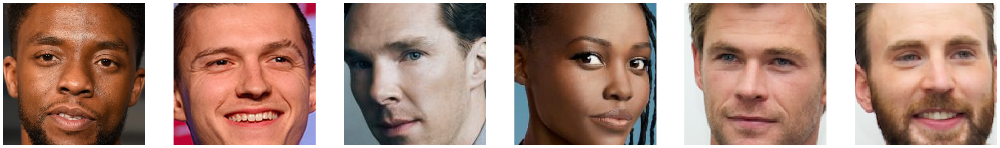

In [ ]:
cropped = crop_multiple_images(images, pcn_detector)
show_images_plt(cropped)

## Face Tracking

In [20]:
class FaceNotFoundException(Exception):
  pass

In [21]:
class FaceTracker(object):

  def __init__(self, detector, scale):
    self.detector = detector
    self.scale = scale
    self.frame_number = 0

  def track(self, frame):
    faces = self._track(frame)
    self.frame_number += 1
    height, width, _  = frame.shape
    faces = [self._bound_coordinates(f, width,height) for f in faces]
    return faces, frame, (self._crop_image(frame, *(faces[0])) if len(faces) > 0 else frame)

  def overlay(self, frame, faces):
      self._draw_rectangle(frame, faces)
      self._overlay(frame)
  
  def detect(self, frame):
    faces =  self.detector(self._scale_down(frame, self.scale))
    return [self._scale_face(frame, f, self.scale) for f in faces]
    
  def _draw_rectangle(self, image, faces):
    for (x, y, w, h) in faces:
        x,y,w,h = int(x),int(y),int(w),int(h)
        cv.rectangle(image, (x, y), (x+w, y+h), (0, 255, 0), 2)
    return image
  
  def _scale_down(self, image, scale):
    return cv.resize(image, (int(image.shape[1]//scale),int(image.shape[0]//scale)), interpolation = cv.INTER_AREA)
  
  def _scale_face(self, image, face, scale):
    x,y,w,h = face
    scaled_width = image.shape[1]//scale
    scaled_height = image.shape[0]//scale
    width = int(w * scale)
    height = int(h * scale)
    x2 = x/scaled_width * image.shape[1]
    y2 = y/scaled_height * image.shape[0]
    return (x2,y2,width,height)

  def _bound_coordinates(self, face, width, height):
    x,y,w,h = face
    x1 = 0 if x < 0 else width - 1 if x > width else x
    y1 = 0 if y < 0 else height - 1 if y > height else y
    x2 = 0 if x+w < 0 else width - 1 if x+w > width else x+w
    y2 = 0 if y+h < 0 else height - 1 if y+h > height else y+h
    return int(x1), int(y1), int(x2-x1), int(y2-y1)

  def _crop_image(self, image, x, y, w, h):
    """Coordinates should have been bound to fall within the image"""
    x1,y1,x2,y2 = x,y,w+x,h+y
    return image[y1:y2, x1:x2]


In [22]:
class NaiveKLTBoxing(FaceTracker):

  def __init__(self, detector, scale):
    # params for ShiTomasi corner detection
    self.feature_params = dict( maxCorners = 5000,
                          qualityLevel = 0.01,
                          minDistance = 10,
                          blockSize = 7 )
    # Parameters for lucas kanade optical flow
    self.lk_params = dict( winSize  = (15,15),
                      maxLevel = 2,
                      criteria = (cv.TERM_CRITERIA_EPS | cv.TERM_CRITERIA_COUNT, 10, 0.03)) 
    self.old_points = None
    super().__init__(detector, scale)

  def _overlay(self, frame):
    for i in self.old_points:
      x,y = i.ravel()
      cv.circle(frame,(x,y),3,255,-1)
  
  def _to_gray(self, frame):
    return cv.cvtColor(frame, cv.COLOR_BGR2GRAY)
    
  def _features_to_track(self, frame):
      faces = self.detect(frame)
      self.old_frame = frame
      if(len(faces) > 0):
        face_found = True
        height, width, _ = frame.shape
        x,y,w,h = self._bound_coordinates(faces[0], width, height)
        # padding works as ((top, bottom), (left, right))
        face_mask = np.pad(np.ones(shape=(h,w)), ((y, height-y-h),(x, width-x-w)) , 'constant', constant_values=0)
        self.old_points = cv.goodFeaturesToTrack(self._to_gray(frame),mask=np.uint8(face_mask), **self.feature_params)
      return faces
  
  def _track_points(self, frame):
      new_points, st, err = cv.calcOpticalFlowPyrLK(self._to_gray(self.old_frame), self._to_gray(frame), self.old_points, None, **self.lk_params)
      new_points = new_points[st==1]
      self.old_frame = frame
      height, width, _ = frame.shape
      min_x,min_y, max_x, max_y = width, height, 0, 0
      for i in new_points:
        x,y = i.ravel()
        min_x, min_y = min(x, min_x), min(y, min_y)
        max_x, max_y = max(x, max_x), max(y, max_y)
      x,y,w,h = min_x,min_y,max_x-min_x, max_y-min_y
      faces = [(x,y,w,h)]
      self.old_points = new_points.reshape(-1,1,2)
      return faces

  def _track(self, frame):
    return self._features_to_track(frame) if self.frame_number == 0 else self._track_points(frame)
  
  def __str__(self):
     return f"{self.__class__.__name__}-{self.detector.__name__}-scale_{self.scale}"

In [23]:
class KLTBoxingWithThresholding(NaiveKLTBoxing):

    def __init__(self, detector, scale, recompute_threshold = 0.25):
        super().__init__(detector, scale)
        self.detector = detector
        self.scale = scale
        self.recompute_threshold = recompute_threshold
        self.old_frame = None
        self.old_points = None
        self.cumulative_change = 0
        self.redetects = 0

    def _redetect(self, frame):
        faces = self._features_to_track(frame)
        self.cumulative_change = 0
        self.redetects += 1
        if(len(faces) > 0):
            x,y,w,h = faces[0]
            self.estimated_size = w*h
        return faces
        
    def _track(self, frame):
        faces = None
        if self.frame_number == 0 or self.cumulative_change > self.recompute_threshold:
            faces = self._redetect(frame)
        else: 
            faces = self._track_points(frame)
            x,y,w,h = faces[0]
            increase_in_size = abs(self.estimated_size - (w*h))/self.estimated_size
            self.cumulative_change += increase_in_size + (increase_in_size*self.cumulative_change)
            self.estimated_size = w*h
            if self.cumulative_change > self.recompute_threshold:
                faces = self._redetect(frame)
        return faces
  
    def __del__(self):
        print(f"{self.redetects}/{self.frame_number}={100*self.redetects/self.frame_number}%")

    def __str__(self):
        return f"{self.__class__.__name__}-{self.detector.__name__}-scale_{self.scale}"

In [24]:
class RepeatedDetector(FaceTracker):

  def __init__(self, detector, scale):
    super().__init__(detector=detector, scale=scale)
    self.detector = detector
    self.scale = scale

  def _track(self, frame):
    return self.detect(frame)
  
  def _overlay(self, frame):
    pass

  def __str__(self):
     return f"{self.__class__.__name__}-{self.detector.__name__}-scale_{self.scale}"

## Face Detection Evaluation

In [ ]:
detectors = [haar_detector, dnn_detector, mtcnn_detector, dlib_hog_detector, pcn_detector]

Simple evaluation over the example images

In [ ]:
def evaluate_face_detection():
  results = []
  scale = 1
  while scale < 10:
    for d in detectors: 
      start = time.time()
      faces = [draw_rectangle(i.copy(), [scale_face(i, f, scale)]) for i in images for f in d(scale_down(i.copy(),scale))]
      end = time.time()
      results.append((d.__name__, scale, faces, len(faces), end-start))
    scale += 0.1
  return pd.DataFrame(results, columns=['detector', 'scale', 'image returned', 'number of faces', 'execution time'])

In [ ]:
results = evaluate_face_detection()

In [ ]:
results.to_csv(f"{PATH}output/results.csv")

In [ ]:
results = pd.read_csv(f"{PATH}output/results.csv") 

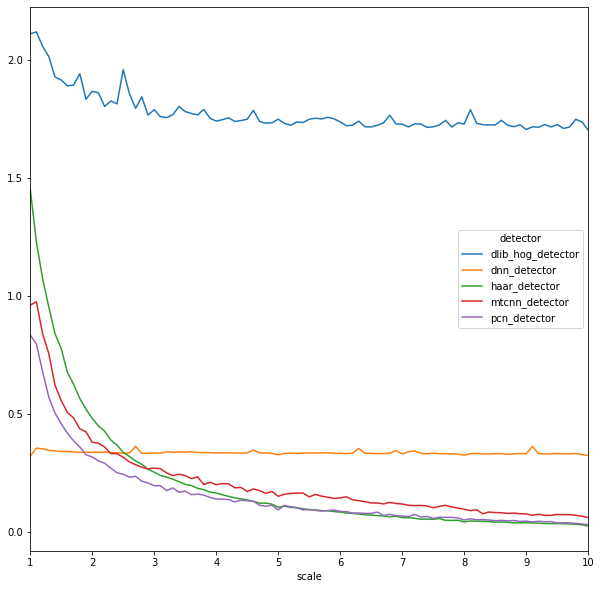

In [ ]:
data = results.pivot(index='scale', columns='detector', values='execution time')
data.plot(figsize=(10,10))
# plt.show()

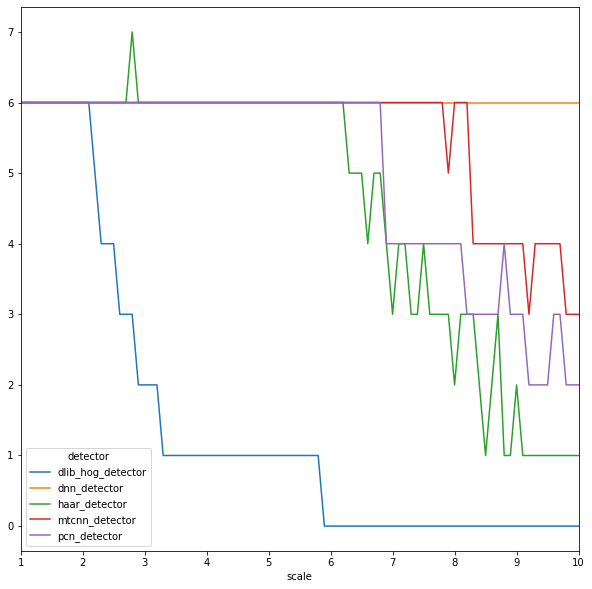

In [ ]:
data = results.pivot(index='scale', columns='detector', values='number of faces')
data.plot(figsize=(10,10))

The issue is that two of the detectors (dnn and hog), I believe, are working on fixed size images which is why their execution time doesn't decrease, so it's not necessarily a fair comparison. We could standardise this by passing them all the same size image (of 300x300) even if that means upscaling a smaller image to compare performance evenly.

Detector: haar_detector in time 1.6173675060272217


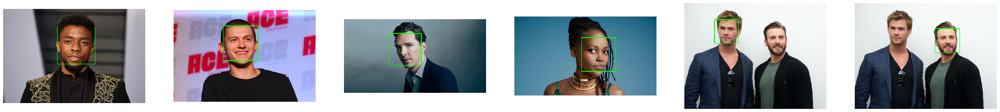

Detector: dnn_detector in time 0.3363008499145508


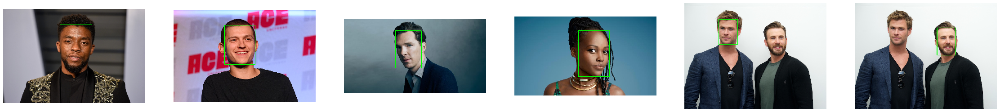

Detector: mtcnn_detector in time 1.003791093826294


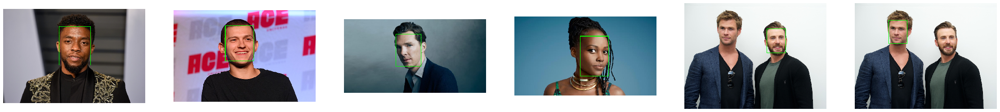

Detector: dlib_hog_detector in time 3.37412166595459


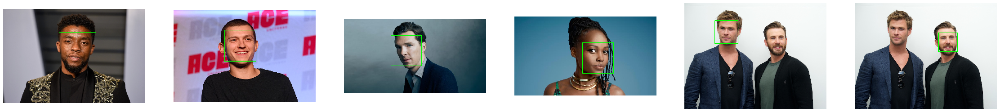

Detector: pcn_detector in time 1.0054130554199219


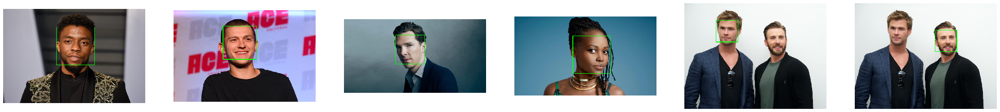

In [ ]:

#show_images_plt([r[1] for r in results])

for r in results:
  print(f"Detector: {r[0]} in time {r[3]}")
  show_images_plt(r[1])

Evaluating the face detectors over videos

In [ ]:
def evaluate_face_detection_over_video(video_file):
  results = []
  scale = 5
  while(scale <= 10):
    for d in detectors:
      cap = cv.VideoCapture(PATH + video_file)
      false_positives = 0
      faces_detected = 0
      total_faces = 0
      total_time = 0
      print(d.__name__)
      while(cap.isOpened()):
        ret, frame = cap.read()
        if ret == False:
          cap.release()
          cv.destroyAllWindows()
          break
        start = time.time()
        faces =  d(scale_down(frame,scale))
        end = time.time()
        total_faces += 1
        total_time += (end-start)
        if len(faces) > 0:
          false_positives += len(faces) - 1 
          faces_detected += 1
      results.append((d.__name__, scale, faces_detected, false_positives, total_faces, total_time, 0 if total_faces == 0 else total_time/total_faces))
    scale += 1
  return pd.DataFrame(results, columns=['detector', 'scale', 'number of faces detected', 'estimated false positives', 'number of frames/faces', 'total execution time', 'average execution time per frame'])

In [ ]:
video_results = evaluate_face_detection_over_video("test-face-detection-videos/VID-2.mp4")

haar_detector
dnn_detector


KeyboardInterrupt: ignored

In [ ]:
video_results.to_csv(f"{PATH}output/video_results.csv")

In [ ]:
video_results = pd.read_csv(f"{PATH}output/video_results.csv") 

In [ ]:
video_results

,detector,scale,number of faces detected,estimated false positives,number of frames/faces,total execution time,average execution time per frame
0,haar_detector,5,458,10,458,50.158249,0.109516
1,dnn_detector,5,458,24,458,34.667170,0.075693
2,mtcnn_detector,5,458,5,458,46.332889,0.101164
3,dlib_hog_detector,5,458,0,458,164.803080,0.359832
4,pcn_detector,5,458,0,458,39.997145,0.087330
5,haar_detector,6,458,0,458,36.416313,0.079512
6,dnn_detector,6,458,15,458,34.571133,0.075483
7,mtcnn_detector,6,458,4,458,37.062621,0.080923
8,dlib_hog_detector,6,458,0,458,161.331415,0.352252
9,pcn_detector,6,458,0,458,31.644470,0.069093


Text(0, 0.5, 'execution time (s)')

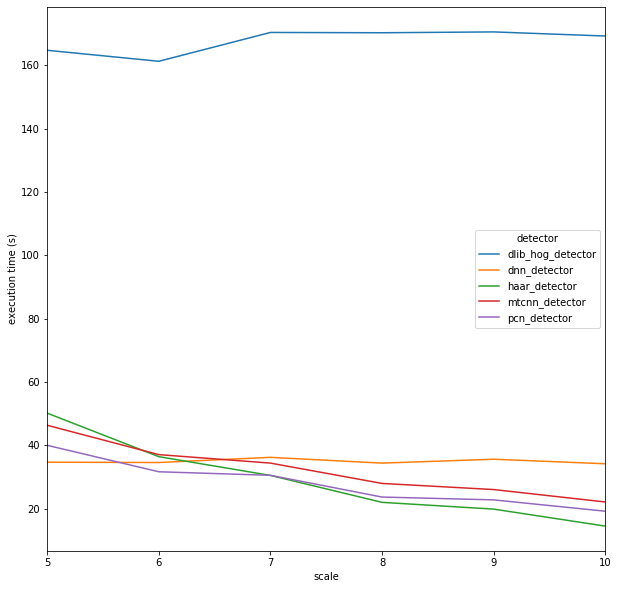

In [ ]:
data = video_results.pivot(index='scale', columns='detector', values='total execution time')
ax = data.plot(figsize=(10,10))
ax.set_ylabel("execution time (s)")

Text(0, 0.5, 'estimated false positives')

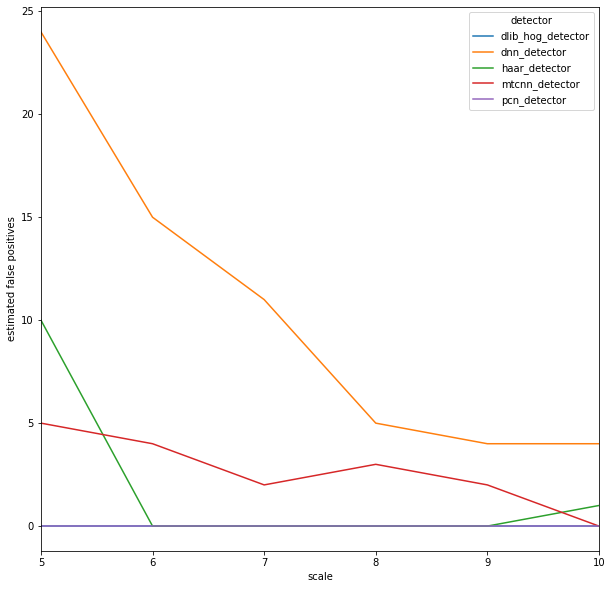

In [ ]:
data = video_results.pivot(index='scale', columns='detector', values='estimated false positives')
ax = data.plot(figsize=(10,10))
ax.set_ylabel('estimated false positives')

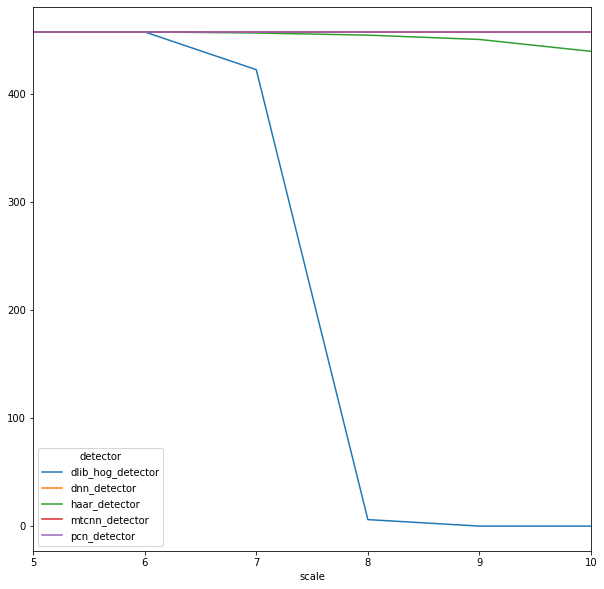

In [ ]:
data = video_results.pivot(index='scale', columns='detector', values='number of faces detected')
data.plot(figsize=(10,10))

## ROI Experimentation

### Skin dataset

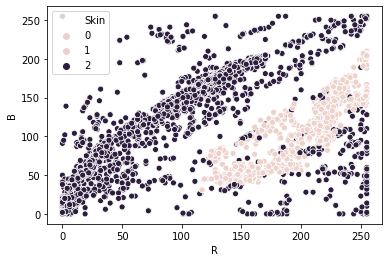

In [24]:
import seaborn as sns
dataset_path = f"{PATH}/skin/Skin_NonSkin.txt"
data = pd.read_csv(dataset_path, sep="\t", header=None)
data.columns = ["B", "G", "R", "Skin"]
indices = np.random.randint(0, len(data), 5000)
to_plot = data.loc[indices]
hue=to_plot["Skin"]
sns.scatterplot(x=to_plot["R"], y=to_plot["B"], hue=hue)

In [32]:
def plot_pca(df, filename, colour_space):
    target = df["Skin"]
    values = [1,2]
    pca = sklearn.decomposition.PCA()
    d = df.drop(columns=["Skin"])
    for col in d.columns:
        d[col] = d[col]/np.std(d[col])
    pca_result = pca.fit_transform(d[d.columns])
    fig, ax = plt.subplots(figsize=(14,11))
    cmap = matplotlib.cm.get_cmap('jet')
    x, y = pca_result[:,0], pca_result[:,1]
    cdict = {j : cmap(i*1/len(values)) for i,j in enumerate(values)}
    for p in values:
        i = (target == p)
        ax.scatter(x[i], y[i], c=[cdict[p]],label=p, alpha=0.5)
    ax.set_xlabel("First principal component")
    ax.set_ylabel("Second principal component")
    ax.title.set_text(f"PCA applied to the skin dataset using the {colour_space} colour space")
    ax.legend()
    plt.savefig(filename)
    plt.show()

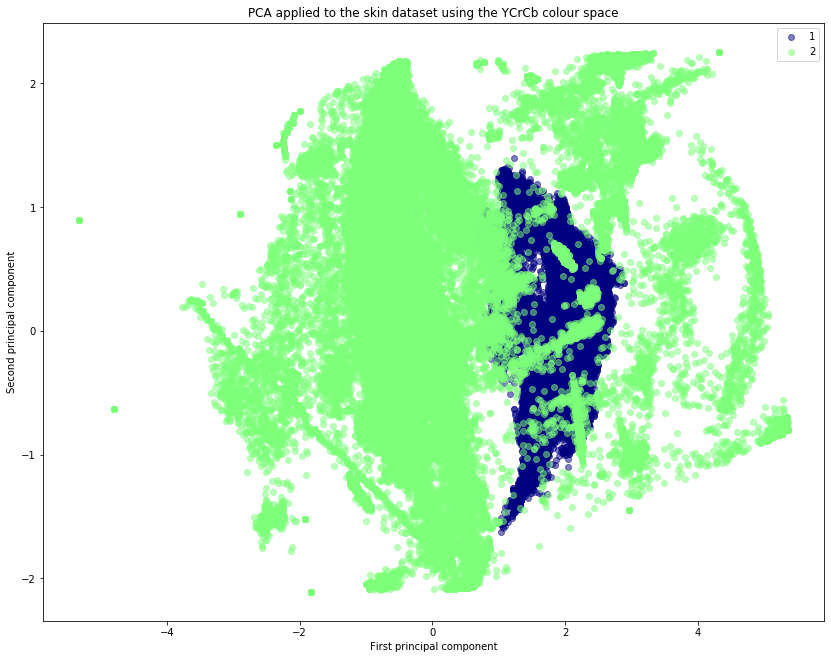

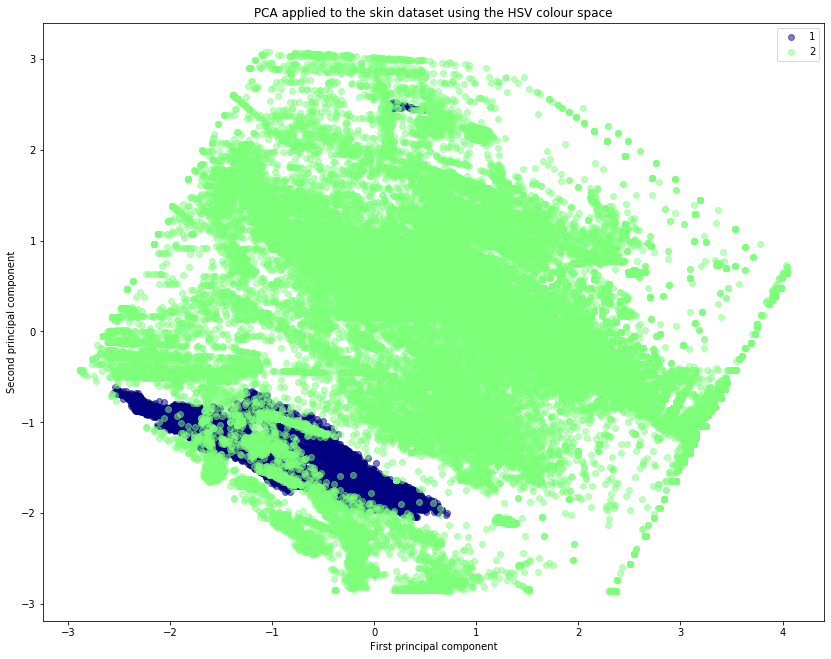

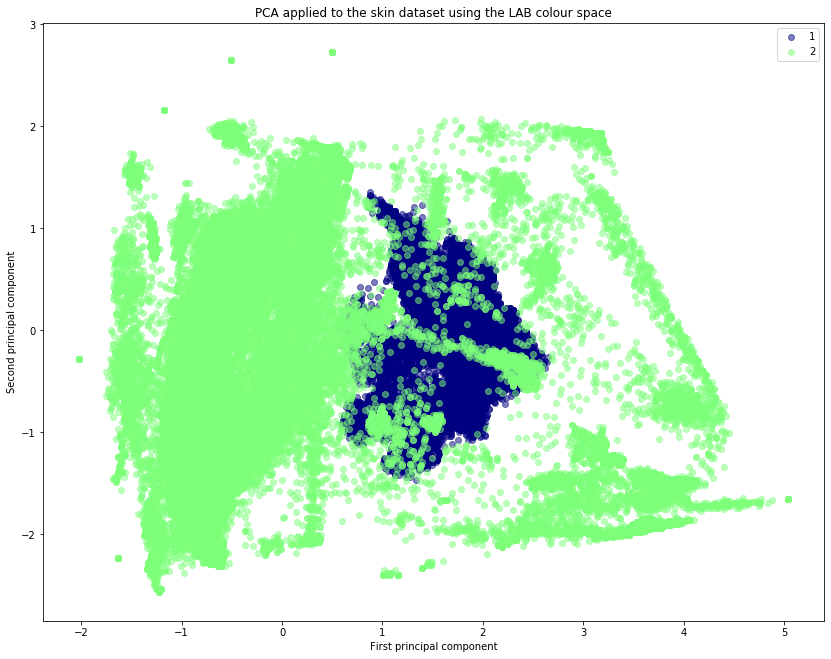

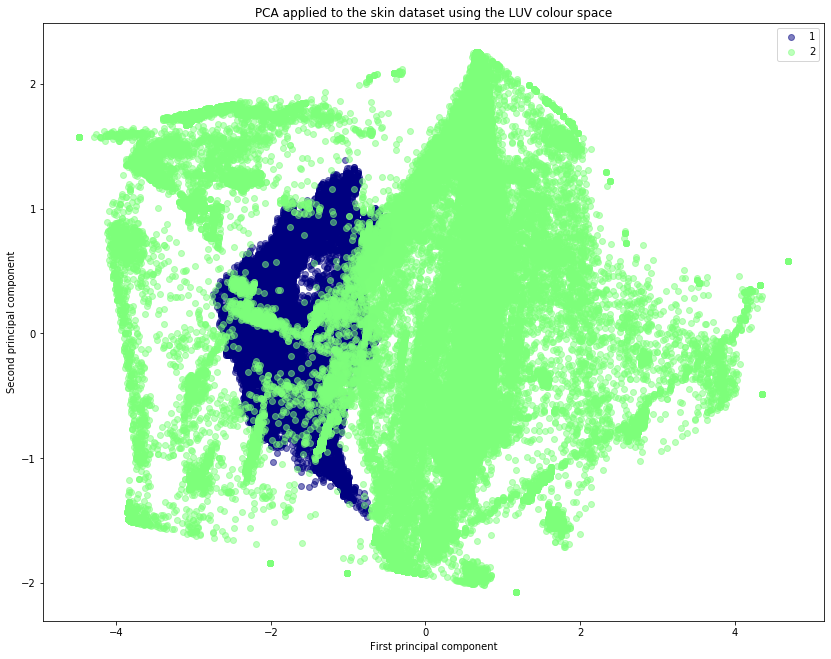

In [78]:
conversions = {"YCrCb":cv.COLOR_BGR2YCrCb, "HSV":cv.COLOR_BGR2HSV, "LAB":cv.COLOR_BGR2LAB, "LUV":cv.COLOR_BGR2LUV}
for space in conversions.keys():
    image = data[["B", "G", "R"]].to_numpy()
    size,_ = image.shape
    image = np.uint8(image.reshape(size,1,3))
    new_data = np.zeros(shape=(size,4))
    new_data[:,:3] = cv.cvtColor(image, conversions[space]).reshape(size, 3)
    new_data[:,3] = data["Skin"]
    conv = pd.DataFrame(new_data, columns=["1st dim", "2nd dim", "3rd dim", "Skin"])
    plot_pca(conv, f"pca_{space}.png", space)

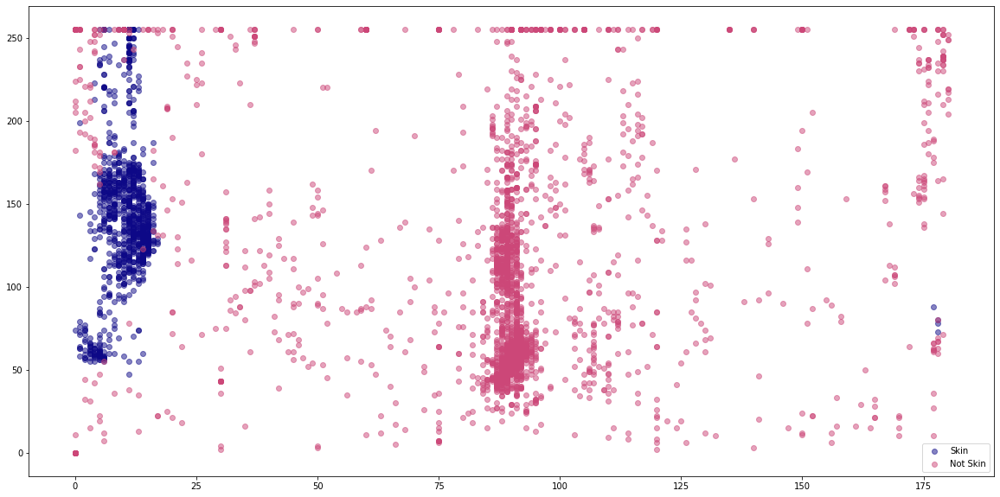

In [90]:
cmap = matplotlib.cm.get_cmap('plasma')

image = data[["B", "G", "R"]].to_numpy()
size,_ = image.shape
image = np.uint8(image.reshape(size,1,3))
new_data = np.zeros(shape=(size,4))
# new_data[:,:3] = cv.cvtColor(image, cv.COLOR_BGR2YCrCb).reshape(size, 3)
new_data[:,:3] = cv.cvtColor(image, cv.COLOR_BGR2HLS).reshape(size, 3)
new_data[:,3] = data["Skin"]
new_data = pd.DataFrame(new_data, columns=["Y", "Cr", "Cb", "Skin"])
indices = np.random.randint(0, len(data), 5000)
new_data = new_data.loc[indices]

values = [1,2]
targets = [None, "Skin", "Not Skin"]
cdict = {j : cmap(i*1/len(values)) for i,j in enumerate(values)}
x = new_data["Y"]
y = new_data["Cb"]
fig, ax = plt.subplots(figsize=(20,10))
for p in values: 
    i = (new_data["Skin"] == p)
    ax.scatter(x[i], y[i], c=[cdict[p]],label=targets[p], alpha=0.5)
ax.legend()

### Custom algorithm

In [ ]:
def centroid_histogram(clt):
	# grab the number of different clusters and create a histogram
	# based on the number of pixels assigned to each cluster
	numLabels = np.arange(0, len(np.unique(clt.labels_)) + 1)
	(hist, _) = np.histogram(clt.labels_, bins = numLabels)
 
	# normalize the histogram, such that it sums to one
	hist = hist.astype("float")
	hist /= hist.sum()
 
	# return the histogram
	return hist

In [ ]:
def plot_colors(hist, centroids):
	# initialize the bar chart representing the relative frequency
	# of each of the colors
	bar = np.zeros((50, 300, 3), dtype = "uint8")
	startX = 0
 
	# loop over the percentage of each cluster and the color of
	# each cluster
	for (percent, color) in zip(hist, centroids):
		# plot the relative percentage of each cluster
		endX = startX + (percent * 300)
		cv.rectangle(bar, (int(startX), 0), (int(endX), 50),
			color.astype("uint8").tolist(), -1)
		startX = endX
	
	# return the bar chart
	return bar

In [ ]:
def plot_cluster_centers(clt):
  hist = centroid_histogram(clt)
  bar = plot_colors(hist, clt.cluster_centers_)
  clt.cluster_centers_
  plt.figure()
  plt.axis("off")
  plt.imshow(bar)
  plt.show()

In [ ]:
def primitive_roi(image):
  return np.zeros(shape=image.shape)

### Markov clustering

In [58]:
import markov_clustering as mc
def adjacency_matrix(image):
    h,w,_ = image.shape
    matrix = np.diag(np.diag(np.ones(h*w, dtype=np.uint8)))
    return matrix
    
def mcl(image):
    matrix = adjacency_matrix(image)
    result = mc.run_mcl(matrix, inflation=inflation)
    clusters = mc.get_clusters(result)

In [59]:
adjacency_matrix(cropped[0])

MemoryError: Unable to allocate array with shape (99186, 99186) and data type uint8

### K-Means


In [209]:
from sklearn.cluster import KMeans

def include_indices(image):
    h,w,_ = image.shape
    arr = np.zeros(shape=(h*w,5))
    arr[:,:3] = image.reshape((h*w,3))
    i = np.arange(h*w)
    arr[:,3] = i % w
    arr[:,4] = i // w
    return arr
    
def fit_kmeans(image):
    h,w,_ = image.shape
    arr = image.reshape((h*w,3))
#     arr = include_indices(image)
    kmeans = KMeans(n_clusters=2).fit(arr)
    return np.uint8(kmeans.labels_.reshape((h,w)))

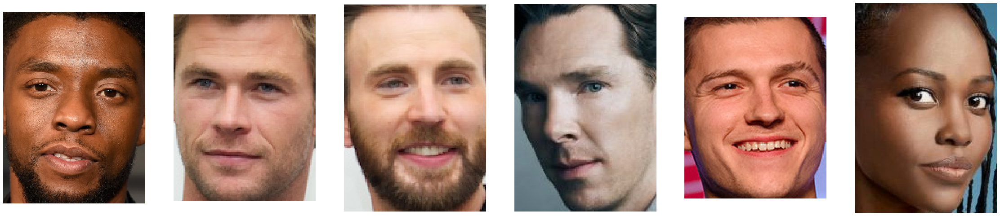

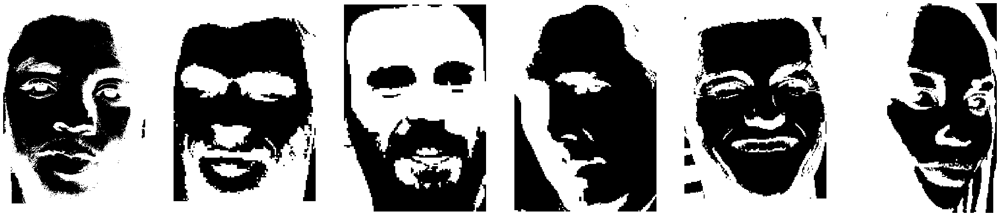

YCrCb


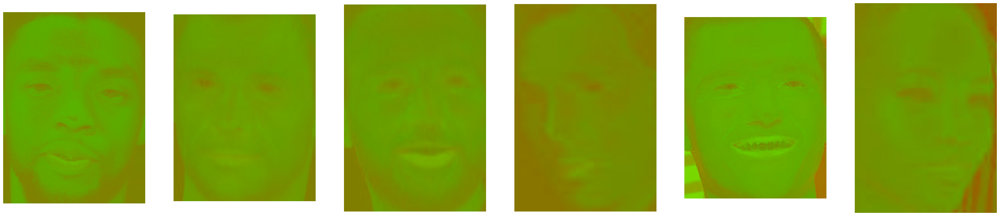

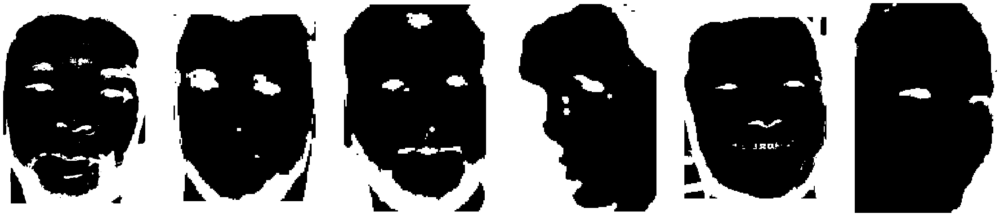

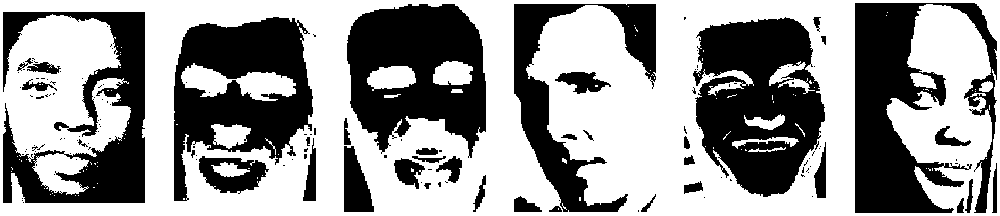

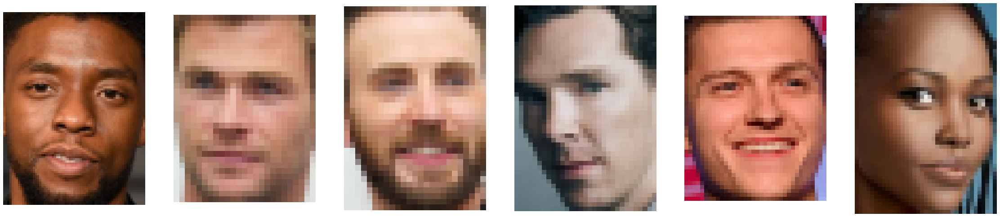

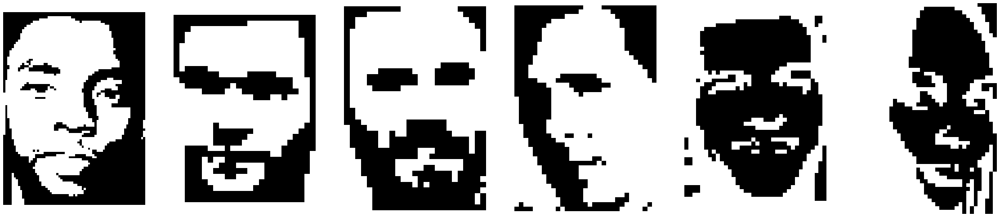

In [210]:
show_images_plt(cropped)
show_images_plt([255*fit_kmeans(i) for i in cropped])

print("YCrCb")
conv = []
fitted = []
for i in cropped:
    ycrcb = cv.cvtColor(i, cv.COLOR_BGR2YCrCb)
    ycrcb[:,:,0]=0
    conv.append(ycrcb)
    fitted.append(255*fit_kmeans(ycrcb))
show_images_plt(conv)
show_images_plt(fitted)
    
show_images_plt([255*fit_kmeans(cv.cvtColor(i, cv.COLOR_BGR2YCrCb)) for i in cropped])
# show_images_plt([cv.bitwise_and(i, i, mask=fit_kmeans(i)) for i in cropped])
scale = 4
scaled = [cv.resize(i, (int(i.shape[1]//scale),int(i.shape[0]//scale)), interpolation = cv.INTER_AREA) for i in cropped]
show_images_plt(scaled)
show_images_plt([255*fit_kmeans(i) for i in scaled])

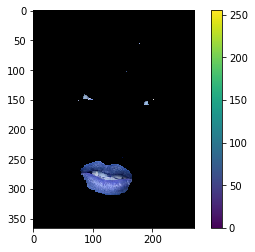

(<matplotlib.image.AxesImage at 0x7f3d8df14be0>,
 None)

In [207]:
#GrabCut is far too slow
img = cropped[0]
mask = np.zeros(img.shape[:2],np.uint8)
bgdModel = np.zeros((1,65),np.float64)
fgdModel = np.zeros((1,65),np.float64)
rect = (50,50,450,290)
cv.grabCut(img,mask,rect,bgdModel,fgdModel,5,cv.GC_INIT_WITH_RECT)
mask2 = np.where((mask==2)|(mask==0),0,1).astype('uint8')
img = img*mask2[:,:,np.newaxis]
plt.imshow(img),plt.colorbar(),plt.show()

In [ ]:
def custom_skin_detector(value, distance, pixel):
  # only include values with distance of value and return a mask
  pass

In [ ]:
def colour_to_image(colour):
  return np.ones(shape=(100,100,3), dtype=np.uint8)*np.uint8(colour)

def colour_YUV_to_image(colour):
  return cv.cvtColor(np.ones(shape=(100,100,3), dtype=np.uint8)*np.uint8(colour), cv.COLOR_YUV2BGR)

def mean(image):
  return image.mean(axis=0).mean(axis=0)

def dominant_colour(image):
  image = cv.cvtColor(image, cv.COLOR_BGR2YUV)
  image = image.reshape((image.shape[0] * image.shape[1], 3))
  clt = KMeans(n_clusters = 3)  
  clt.fit(image)
  return clt

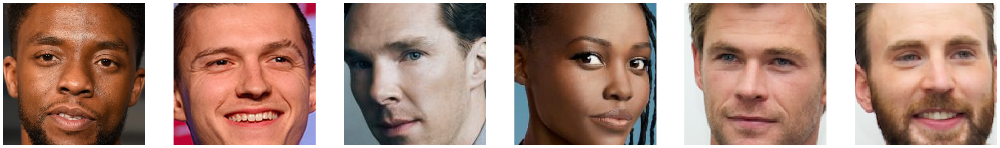

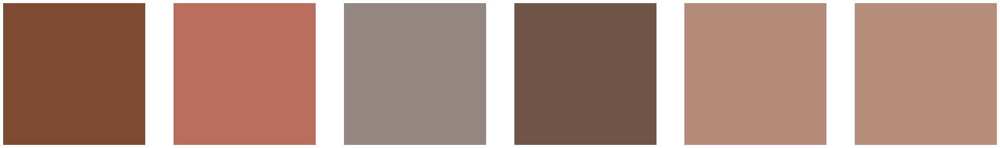

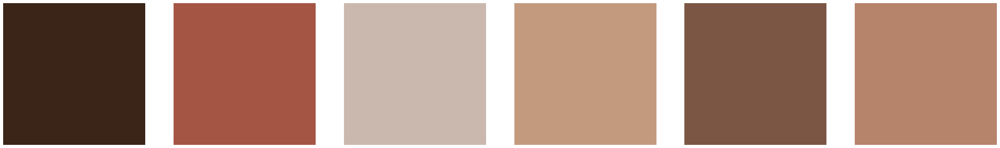

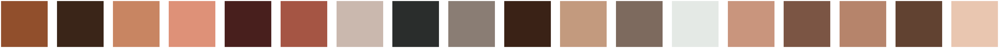

In [ ]:
show_images_plt(cropped)
show_images_plt([colour_to_image(mean(image.copy())) for image in cropped])
show_images_plt([colour_YUV_to_image(dominant_colour(image.copy()).cluster_centers_[0]) for image in cropped])
show_images_plt([colour_YUV_to_image(col) for image in cropped for col in dominant_colour(image.copy()).cluster_centers_])
#print([dominant_colour(image.copy()) for image in cropped])
#print([str(mean(image.copy())) + " vs " + str(dominant_colour(image.copy())) for image in cropped])

### Skin Detection

In [ ]:
def skin_detector(image, lower_hsv_bound = (0,0,0), upper_hsv_bound = (20,170,255), lower_ycrcb_bound=(0,135,85), upper_ycrcb_bound=(255,180,135)):
  """
  Computes 2D arrays where 255 means the pixel is likely to be non-skin and 0 means it might be skin
  """
  img_HSV = cv.cvtColor(image, cv.COLOR_BGR2HSV)
  #skin color range for hsv color space 
  HSV_mask = cv.inRange(img_HSV, lower_hsv_bound, upper_hsv_bound) 
  HSV_mask = cv.morphologyEx(HSV_mask, cv.MORPH_OPEN, np.ones((4,4), np.uint8))

  #converting from gbr to YCbCr color space
  img_ycrcb = cv.cvtcolor(image, cv.color_bgr2ycrcb)
  #skin color range for hsv color space 
  ycrcb_mask = cv.inrange(img_ycrcb, lower_ycrcb_bound, upper_ycrcb_bound)
  ycrcb_mask = cv.morphologyex(ycrcb_mask, cv.morph_open, np.ones((3,3), np.uint8))

  #merge skin detection (YCbCr and hsv)
  global_mask=cv.bitwise_and(YCrCb_mask,HSV_mask)
  global_mask=cv.medianBlur(global_mask,3)
  global_mask = cv.morphologyEx(global_mask, cv.MORPH_OPEN, np.ones((4,4), np.uint8))


  HSV_result = cv.bitwise_not(HSV_mask)
  YCrCb_result = cv.bitwise_not(YCrCb_mask)
  global_result = cv.bitwise_not(global_mask) 
  return HSV_result, YCrCb_result, global_result, cv.bitwise_and(image,image,mask = global_result)

def skin_roi(image):
  return skin_detector(image)[1]

def skin_roi_ycrcb(image,lower_ycrcb_bound=(0,135,85), upper_ycrcb_bound=(255,180,135)):
  img_ycrcb = cv.cvtcolor(image, cv.color_bgr2ycrcb)
  #skin color range for hsv color space 
  ycrcb_mask = cv.inrange(img_ycrcb, lower_ycrcb_bound, upper_ycrcb_bound)
  ycrcb_mask = cv.morphologyex(ycrcb_mask, cv.morph_open, np.ones((3,3), np.uint8))
  return cv.bitwise_not(ycrcb_mask)

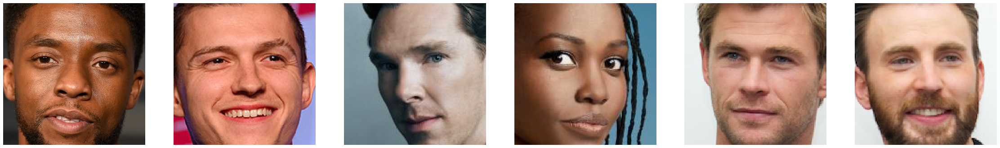

In [ ]:
show_images_plt(cropped)

In [ ]:
%timeit [skin_detector(image) for image in cropped] 

100 loops, best of 3: 2.16 ms per loop


(318, 318)
(167, 167)
(156, 156)
(165, 165)
(129, 129)
(130, 130)


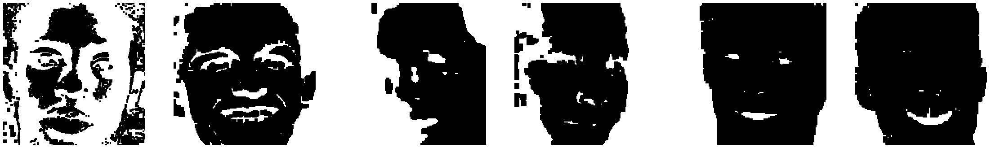

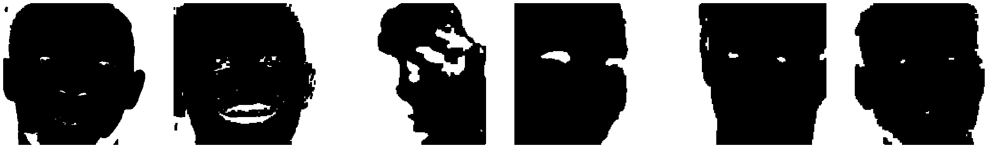

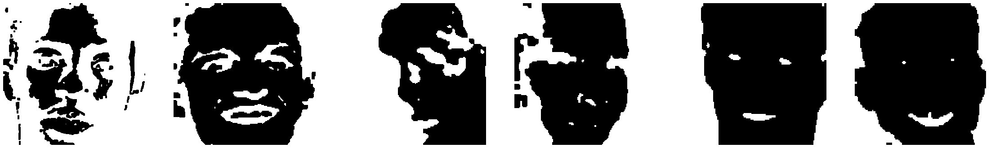

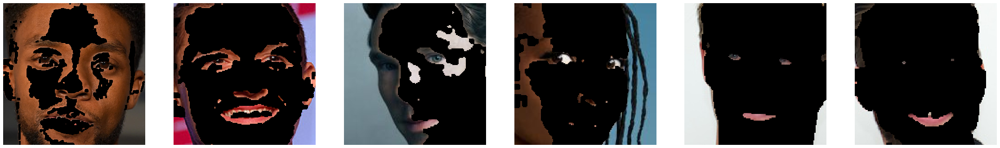

In [ ]:
results = [skin_detector(image) for image in cropped]
split = [list(t) for t in zip(*results)]

show_images_plt([cv.cvtColor(i, cv.COLOR_GRAY2BGR) for i in split[0]])
show_images_plt([cv.cvtColor(i, cv.COLOR_GRAY2BGR) for i in split[1]])
show_images_plt([cv.cvtColor(i, cv.COLOR_GRAY2BGR) for i in split[2]])
show_images_plt([i for i in split[3]])

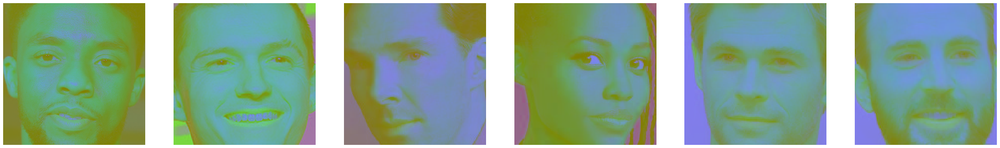

In [ ]:
show_images_plt([cv.cvtColor(image, cv.COLOR_BGR2YCrCb) for image in cropped])

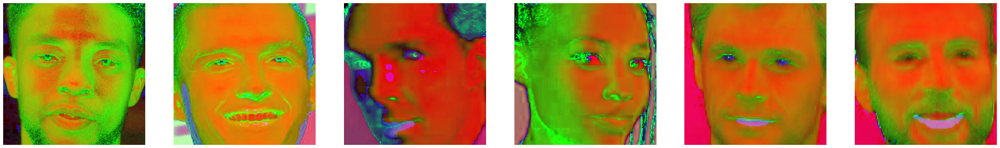

In [ ]:
show_images_plt([cv.cvtColor(image, cv.COLOR_BGR2HSV) for image in cropped])

### CRF

In [15]:
threshold = 300
def mean_colour(image):
    return image.mean(axis=0).mean(axis=0)

def dominant_colour(image):
    """
    Relies on assumption that majority of pixels are skin pixels
    """
    h,w,_ = image.shape
    arr = image.reshape((h*w,3))
    kmeans = KMeans(n_clusters=2).fit(arr)
    counts = np.bincount(kmeans.labels_)
    dominant = counts.argmax()
    return kmeans.cluster_centers_[dominant]
    
def rough_skin_heatmap(image):
    ycrcb = cv.cvtColor(image, cv.COLOR_BGR2YCrCb)
    ycrcb[:, :, 0] = 0
#     col = mean_colour(image)
    col = dominant_colour(ycrcb)
    unary = np.float64(np.abs(ycrcb-col)).sum(axis=2)
#     unary = np.exp(-1*(unary/30))
    unary = (np.max(unary)-unary)/np.max(unary)
#     return np.uint8(unary<threshold)
#     return np.exp(unary)/sum(np.exp(unary))
    return unary
#     return np.float64(np.exp(-1*unary/3000))

[[0.65114667 0.65114667 0.65114667 ... 0.13022933 0.13022933 0.13022933]
 [0.65114667 0.65114667 0.65114667 ... 0.13022933 0.13022933 0.13022933]
 [0.65114667 0.65114667 0.65114667 ... 0.13953143 0.13953143 0.13953143]
 ...
 [0.91160533 0.92090743 0.93020952 ... 0.51161524 0.50231314 0.46510476]
 [0.91160533 0.92090743 0.93020952 ... 0.49301105 0.48370895 0.45580267]
 [0.90230324 0.92090743 0.93020952 ... 0.47440686 0.47440686 0.43719848]]


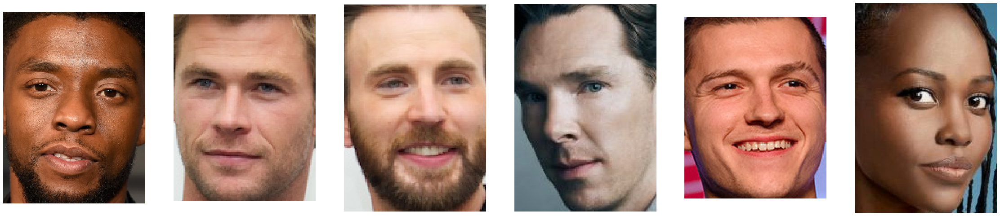

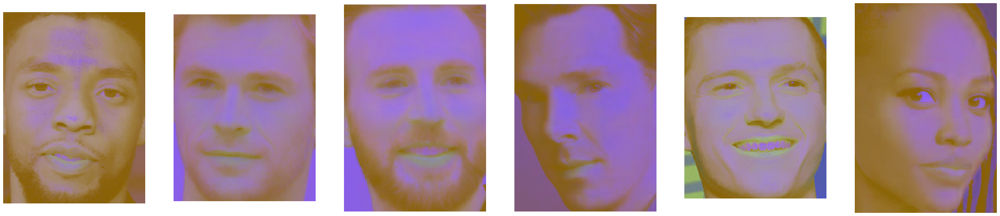

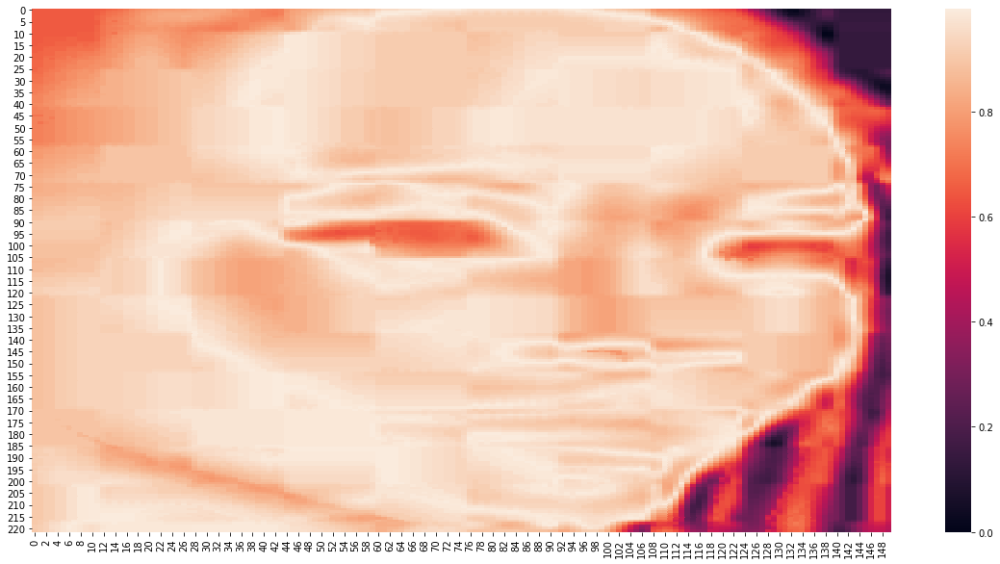

In [16]:
import seaborn as sns
x = rough_skin_heatmap(cropped[5])
print(x)
# show_images_plt([255*rough_skin_heatmap(i) for i in cropped])
show_images_plt(cropped)
show_images_plt([cv.cvtColor(i, cv.COLOR_BGR2LUV) for i in cropped])
fig, ax = plt.subplots(figsize=(20,10))
ax = sns.heatmap(x)

In [21]:
import pydensecrf.densecrf as dcrf
from pydensecrf.utils import unary_from_labels, create_pairwise_bilateral, create_pairwise_gaussian, unary_from_softmax

def reshape_heatmap(heatmap):
    h,w = heatmap.shape
    energy = np.zeros(shape=(2,h*w))
    x = heatmap.reshape((h*w))
    y = 1-x
    energy[0, :] = x
    energy[1, :] = y
    return energy
    
def crf(image):
    image = cv.cvtColor(image, cv.COLOR_BGR2YCrCb)
    image[:,:,0] = 0
    h,w,_ = image.shape
    N_LABELS = 2
    # Example using the DenseCRF class and the util functions
    d = dcrf.DenseCRF(h*w, N_LABELS)

    # get unary potentials (neg log probability)
#     U = unary_from_labels(labels, N_LABELS, gt_prob=0.7, zero_unsure=HAS_UNK)
    softmax = reshape_heatmap(rough_skin_heatmap(image))
    U = unary_from_softmax(softmax)
#     labels = np.uint8(rough_skin_heatmap(image)<0.5)
#     labels[labels==0] = 2 
#     print(labels)
#     U = unary_from_labels(labels, N_LABELS, gt_prob=0.7)
    d.setUnaryEnergy(U)

    # This creates the color-independent features and then add them to the CRF
#     feats = create_pairwise_gaussian(sdims=(3, 3), shape=image.shape[:2])
#     d.addPairwiseEnergy(feats, compat=3,
#                         kernel=dcrf.DIAG_KERNEL,
#                         normalization=dcrf.NORMALIZE_SYMMETRIC)

    # This creates the color-dependent features and then add them to the CRF
    feats = create_pairwise_bilateral(sdims=(1, 1), schan=(13,13,13),
                                      img=image, chdim=2)
    d.addPairwiseEnergy(feats, compat=10,
                        kernel=dcrf.FULL_KERNEL,
                        normalization=dcrf.NORMALIZE_SYMMETRIC)
    # Find out the most probable class for each pixel.
    Q = d.inference(5)
    MAP = np.argmax(Q, axis=0)

    # Convert the MAP (labels) back to the corresponding colors and save the image.
    # Note that there is no "unknown" here anymore, no matter what we had at first.
#     MAP = colorize[MAP,:]
    return np.uint8(MAP.reshape(h,w))

[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]


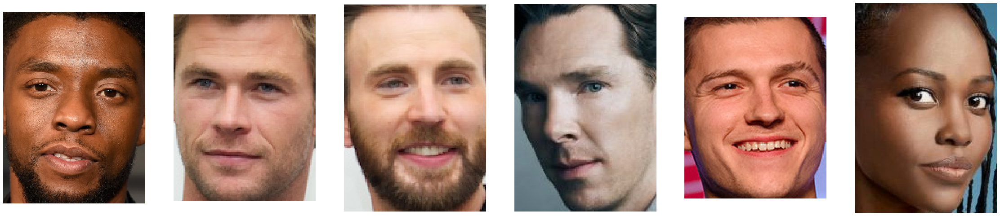

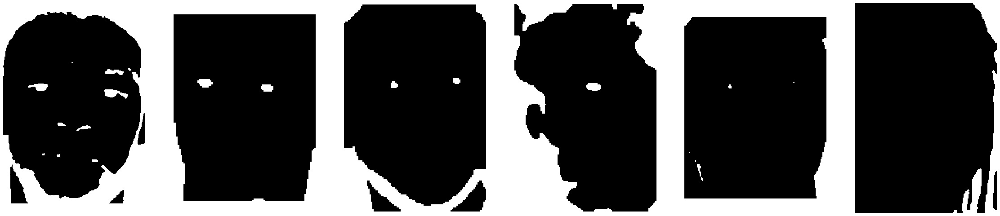

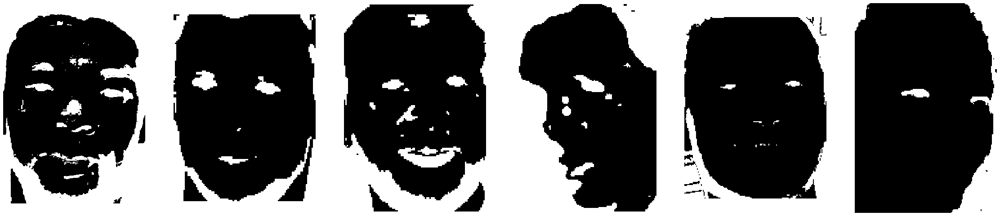

In [25]:
print(crf(cropped[0]))
threshold = 0.7
show_images_plt(cropped)
show_images_plt([255*crf(i) for i in cropped])
show_images_plt([255*np.uint8(rough_skin_heatmap(i)<threshold) for i in cropped])

### Flood Filling

In [ ]:
def flood_fill(image):
  h,w,n = image.shape
  cv.floodFill(image, mask=np.zeros((h+2,w+2), np.uint8), newVal = (255,255,255), loDiff=(5,)*3, upDiff=(5,)*3, seedPoint=(int(w/2),int(h/2)), flags=8)
  return image

In [ ]:
%timeit [flood_fill(img.copy()) for img in cropped]
#show_images_plt([flood_fill(img.copy()) for img in cropped])

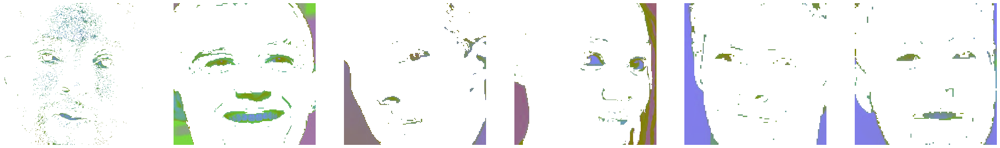

In [ ]:
show_images_plt([flood_fill(cv.cvtColor(image, cv.COLOR_BGR2YCrCb)) for image in cropped])

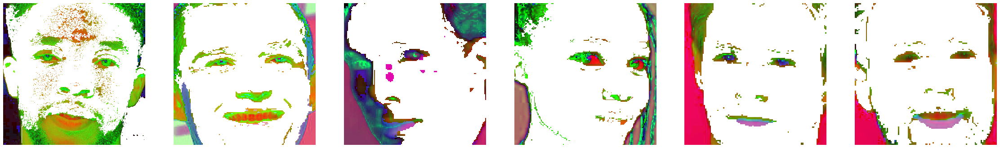

In [ ]:
show_images_plt([flood_fill(cv.cvtColor(image, cv.COLOR_BGR2HSV)) for image in cropped])

### Edge Detection

In [ ]:
def edges(image):
  edges = cv.Canny(image, 80, 240)
  return edges

In [ ]:
cv2_imshow(edges(cropped[0]))

### Contours

In [ ]:
def draw_contours(image):
  imgray = cv.cvtColor(image, cv.COLOR_RGB2GRAY)
  ret, thresh = cv.threshold(imgray, 127, 255, 0)
  im2, contours, hierarchy = cv.findContours(thresh, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)
  cv.drawContours(image, contours, -1, (0, 255, 0), 3)
  return image


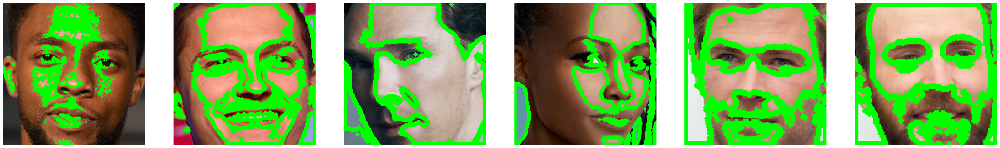

In [ ]:
show_images_plt([draw_contours(image.copy()) for image in cropped])

### Shi-Tomasi

In [ ]:
def shi_tomasi(image, faces):
  for (x,y,w,h) in faces:
    x1,y1,x2,y2 = bound_coordinates(image, x,y,w,h)
    face = image[y1:y2,x1:x2]
    gray = cv.cvtColor(face,cv.COLOR_RGB2GRAY)
    corners = cv.goodFeaturesToTrack(gray,68,0.01,10)
    corners = np.int0(corners)
    
    for i in corners:
      x,y = i.ravel()
      cv.circle(face,(x,y),3,255,-1)
    image[y1:y2,x1:x2] = face
 
  return image

In [ ]:
help(cv.goodFeaturesToTrack)

Help on built-in function goodFeaturesToTrack:

goodFeaturesToTrack(...)
    goodFeaturesToTrack(image, maxCorners, qualityLevel, minDistance[, corners[, mask[, blockSize[, useHarrisDetector[, k]]]]]) -> corners
    .   @brief Determines strong corners on an image.
    .   
    .   The function finds the most prominent corners in the image or in the specified image region, as
    .   described in @cite Shi94
    .   
    .   -   Function calculates the corner quality measure at every source image pixel using the
    .   #cornerMinEigenVal or #cornerHarris .
    .   -   Function performs a non-maximum suppression (the local maximums in *3 x 3* neighborhood are
    .   retained).
    .   -   The corners with the minimal eigenvalue less than
    .   \f$\texttt{qualityLevel} \cdot \max_{x,y} qualityMeasureMap(x,y)\f$ are rejected.
    .   -   The remaining corners are sorted by the quality measure in the descending order.
    .   -   Function throws away each corner for which there is a st

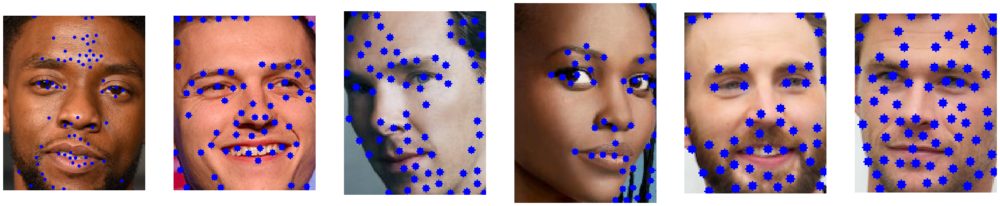

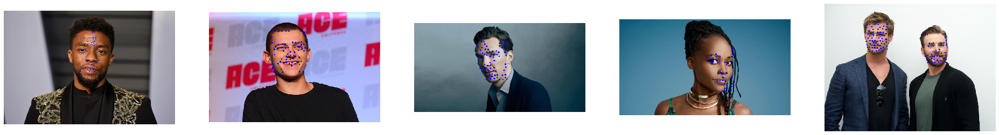

In [ ]:

show_images_plt([shi_tomasi(image.copy(), [(0,0, image.shape[1], image.shape[0])]) for image in cropped])
show_images_plt([shi_tomasi(i.copy(), mtcnn_detector(i)) for i in images])

### GrabCut

In [ ]:
def grab_cut(image):
    h, w = image.shape[:2]
    mask = np.zeros(image.shape[:2], dtype = np.uint8)
    bgdmodel = np.zeros((1, 65), np.float64)
    #rect = (0,0,1,1)
    rect = (0,0,w-1,h-1)
    fgdmodel = np.zeros((1, 65), np.float64)
    cv.grabCut(image, mask, rect, bgdmodel, fgdmodel, 3, cv.GC_INIT_WITH_RECT)
    mask2 = np.where((mask==2)|(mask==0),0,1).astype('uint8')
    image = image*mask2[:,:,np.newaxis]
    return image

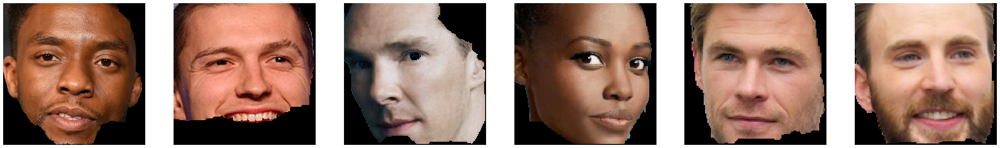

In [ ]:
show_images_plt([grab_cut(image.copy()) for image in cropped])

### Crop image and remove eyes

In [ ]:
cropped_images = []
for (x, y, w, h) in faces:
  cropped_images.append(image[y:y+h, x:x+w])

for image in cropped_images:
  cv2_imshow(image)

NameError: ignored

In [ ]:
eyeCascade = cv.CascadeClassifier(cv.data.haarcascades + "haarcascade_eye.xml")

In [ ]:
def eye_detector(image):
  eyes = eyeCascade.detectMultiScale(
    cv.cvtColor(image, cv.COLOR_BGR2GRAY),
    scaleFactor=1.1,
    minNeighbors=5,
    minSize=(1,1),
    flags = cv.CASCADE_SCALE_IMAGE
  )
  for (x, y, w, h) in eyes:
    cv.rectangle(image, (x, y), (x+w, y+h), (0,0,0), cv.FILLED)
  return image


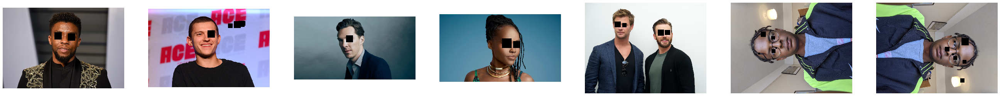

In [ ]:
show_images_plt([eye_detector(image.copy()) for image in images])

# Naive Overall Pipeline

**Naive Computer Vision Pipeline**

1.   Detect face in frame
2.   Apply "ROI" function (could be the entire face box if naive)
3.   Repeat until window size of, W, is reached
4.   At which point, we begin processing the W previous data points to estimate heart rate
5.   Continue collecting data points, for W' steps (labelled as the offset), and then apply signal processing to the window of size W.

**Signal Processing**

1.  Apply ICA to incoming signal to isolate source signal
2.  Apply fourier transform and select the most prevalent frequency
3.  Then apply Kalman filter

In [ ]:
def naive_pipeline(face_detector, roi, aggregate_function, video_path, signal_processor, window_size = 480, offset = 60, display = False, crop=False, frame_width=1000, frame_height=1000):
  cap = cv.VideoCapture(PATH + video_path)
  values = []
  heart_rates = []
  scale = 3
  frame_number = 0
  width = int(cap.get(cv.CAP_PROP_FRAME_WIDTH))
  height = int(cap.get(cv.CAP_PROP_FRAME_HEIGHT))
  out=None
  if display:
    out = cv.VideoWriter(f'{PATH}output/{video_path.split("/")[-1].split(".")[-2]}-{face_detector.__name__}-{roi.__name__}-output-ycrcb-only(1).avi',cv.VideoWriter_fourcc('M','J','P','G'), cap.get(cv.CAP_PROP_FPS), (frame_width,frame_height) if crop else (width, height))
  while(cap.isOpened()):
    ret, frame = cap.read()
    if ret == False:
      cap.release()
      cv.destroyAllWindows()
      break
    faces =  face_detector(scale_down(frame,scale))
    if len(faces) > 0:
      frame_number += 1
      if frame_number % 100 == 0: print(str(frame_number))
      faces = [scale_face(frame, f, scale) for f in faces]
      x,y,w,h = bound_coordinates(faces[0], width, height)
      cropped = crop_image(frame, x,y,w,h)
      area_of_interest = roi(cropped)
      area_of_interest = np.pad(area_of_interest, ((y,height-(y+h)),(x,width-(x+w))), 'constant', constant_values=1)
      area_of_interest = np.repeat(area_of_interest[:, :, np.newaxis], 3, axis=2)
      frame = ma.masked_array(frame, mask=area_of_interest)
      value = aggregate_function(frame)
      if display and crop:
        out.write(cv.resize(area_of_interest, (frame_width, frame_height), interpolation = cv.INTER_AREA))
      elif display and not(crop):
        # Overlay the points being considered and the rectangle of the face
        draw_rectangle(frame, faces)
        rectangle = np.full(shape=(height,width,3), fill_value=[0,255,0], dtype=np.uint8)
        # Need to take and with one vector since otherwise we get 254 instead of the desired value of 0 at each point outside the mask
        # i.e. NOT(0000 0001) = 1111 1110 rather than 0
        mask_of_roi = cv.bitwise_and(cv.bitwise_not(area_of_interest), np.ones(shape=(height,width,3), dtype=np.uint8))
        alpha = 0.5
        foreground = rectangle.astype(float)
        background = frame.astype(float)
        mask_of_roi = mask_of_roi.astype(float)/2
        foreground = cv.multiply(mask_of_roi, foreground)
        background = cv.multiply(1.0-mask_of_roi, background)
        blended = cv.addWeighted(foreground, alpha, background, 1, 0)
        out.write(np.uint8(blended))
      values.append(value)
      # if this is the first time we've reached the required number of values
      if frame_number % window_size == 0 and frame_number//window_size == 1:
        heart_rates.append(signal_processor(values[:window_size]))
      elif (frame_number-window_size)%offset == 0:
        n = int((frame_number-window_size)/offset)
        heart_rates.append(signal_processor(values[n*offset : (n*offset)+window_size]))
    elif display:
      out.write(frame)
  if out != None: out.release()
  return heart_rates


In [25]:
def mean(image):
    return image.mean(axis=0).mean(axis=0)

def primitive_roi(image):
  h,w,_ = image.shape
  return np.uint8(np.zeros(shape=(h,w)))

In [26]:
from sklearn.decomposition import FastICA
from operator import itemgetter

def simple_processor(values, framerate):
    return select_maximum_power_frequency([prevalent_freq(values[:, i], framerate) for i in range(3)])

def ica_processor(values, framerate):
    ica = FastICA(n_components=3, max_iter=4000)
    signals = ica.fit_transform(values)
    return select_maximum_power_frequency([prevalent_freq(signals[:,i], framerate) for i in range(3)])

def prevalent_freq(data, framerate):
    """
    Return the most prevalent frequency using FFT and its power
    """
    data = (data-np.mean(data))/np.std(data)
    transform = np.fft.rfft(data)
    freqs = np.fft.rfftfreq(len(data), 1.0/framerate)
    freqs = 60*freqs
    band_pass = np.where((freqs < 40) | (freqs > 240) )[0]
    transform[band_pass] = 0
    transform = np.abs(transform)**2
    id = np.argmax(transform)
    heart_rate = freqs[id]
    return heart_rate, np.max(transform)

def select_maximum_power_frequency(rates):
    return max(rates, key=itemgetter(1))[0]

In [ ]:
naive_pipeline(haar_detector, skin_roi, mean, "test-face-detection-videos/VID-2.mp4", ica_processor, display=True)

NameError: ignored

In [156]:
ica_processor(ppg, 30)

/home/yousuf/.local/lib/python3.6/site-packages/sklearn/decomposition/fastica_.py:119: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  ConvergenceWarning)


45.49450549450549

In [ ]:
def video_exists(file):
  cap = cv.VideoCapture(file)
  return cap.isOpened()

# KLT-Optical Flow Pipeline

In [27]:
class Visualiser():

  def __init__(self, tracker, video_path, roi, signal_processor, video, crop=False, file_path=None, width=None, height=None):
    if file_path is None: 
      input_video_name = video_path.split("/")[-1].split(".")[-2]
      self.file_path = f'{PATH}output/{input_video_name}-{str(tracker)}-{roi.__name__}-{signal_processor.__name__}.avi'
    else: 
      self.file_path = file_path
    if crop is None and None in [width,height]:
      raise ValueError("If crop is desired, then width and height must be specified")
    self.frame_width = int(video.get(cv.CAP_PROP_FRAME_WIDTH))
    self.frame_height = int(video.get(cv.CAP_PROP_FRAME_HEIGHT))
    self.tracker = tracker
    self.crop = crop
    self.out = cv.VideoWriter(self.file_path,cv.VideoWriter_fourcc('M','J','P','G'), video.get(cv.CAP_PROP_FPS), (self.frame_width,self.frame_height))

  def display(self, frame, faces, area_of_interest):
      height, width, _ = frame.shape
      self.tracker.overlay(frame, faces)

      # Overlay the points being considered and the rectangle of the face
      rectangle = np.full(shape=(height,width,3), fill_value=[0,255,0], dtype=np.uint8)
      # Need to take and with one vector since otherwise we get 254 instead of the desired value of 0 at each point outside the mask
      # i.e. NOT(0000 0001) = 1111 1110 rather than 0
      mask_of_roi = cv.bitwise_and(cv.bitwise_not(area_of_interest), np.ones(shape=(height,width,3), dtype=np.uint8))
      alpha = 0.5
      foreground = rectangle.astype(float)
      background = frame.astype(float)
      mask_of_roi = mask_of_roi.astype(float)/2
      foreground = cv.multiply(mask_of_roi, foreground)
      background = cv.multiply(1.0-mask_of_roi, background)
      blended = cv.addWeighted(foreground, alpha, background, 1, 0)
      if self.crop:
        blended = cv.resize(blended, (self.frame_width, self.frame_height), interpolation = cv.INTER_AREA)
      self.out.write(np.uint8(blended))

In [28]:
def tracking_pipeline(tracker, roi, aggregate_function, video_path, signal_processor, window_size = 900, offset = 60, display = True):
    cap = cv.VideoCapture(PATH + video_path)
    values = []
    heart_rates = []
    width = int(cap.get(cv.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv.CAP_PROP_FRAME_HEIGHT))
    frame_number = 0
    frame_rate = int(cap.get(cv.CAP_PROP_FPS))
    visualiser = None
    if display:
        visualiser = Visualiser(tracker, video_path, roi, signal_processor, cap)
    while(cap.isOpened()):
        ret, frame = cap.read()
        if ret == False:
            cap.release()
            cv.destroyAllWindows()
            break
        face_found = False
        faces, cropped = None, None
        while(not(face_found)):
            faces, frame, cropped = tracker.track(frame)
            if(len(faces) > 0):
                face_found = True
            else:
                ret, frame = cap.read()
                values.append(None)
                if ret == False:
                    cap.release()
                    cv.destroyAllWindows()
                    break
        frame_number += 1
        x,y,w,h = faces[0]
        area_of_interest = roi(cropped)
        area_of_interest = np.pad(area_of_interest, ((y,height-(y+h)),(x,width-(x+w))), 'constant', constant_values=1)
        area_of_interest = np.repeat(area_of_interest[:, :, np.newaxis], 3, axis=2)
        frame = ma.masked_array(frame, mask=area_of_interest)
        value = aggregate_function(frame)
        values.append(value)
        if display:
            visualiser.display(frame, faces, area_of_interest)
        # if this is the first time we've reached the required number of values
        if frame_number % window_size == 0 and frame_number//window_size == 1:
            heart_rates.append(signal_processor(np.array(values[:window_size]), frame_rate))
        elif (frame_number-window_size)%offset == 0 and frame_number>window_size:
            n = int((frame_number-window_size)/offset)
            print(f"N: {n}, Frame number: {frame_number}" )
            heart_rates.append(signal_processor(np.array(values[n*offset : (n*offset)+window_size]), frame_rate))
    return (values, heart_rates)

In [ ]:
start = Timing.time()
file = "movement.mp4"
# ppg, heart_rate = tracking_pipeline(KLTBoxingWithThresholding(dnn_detector, scale=3), primitive_roi, mean,f"test-face-detection-videos/{file}", ica_processor)
ppg, heart_rate = tracking_pipeline(KLTBoxingWithThresholding(dnn_detector, scale=3), crf, mean,f"test-face-detection-videos/{file}", ica_processor)
file_name = file.split(".")[0]
np.savetxt(f"{PATH}/output/ppg/{file_name}-ppg-2.csv", ppg, delimiter=",")
end = Timing.time()
print(end-start)

In [213]:
print(heart_rate)


[54.0, 54.0, 54.0, 48.0, 48.0, 48.0, 48.0, 42.00000000000001, 48.0, 72.00000000000001, 42.00000000000001, 42.00000000000001, 60.0, 78.0, 78.0, 78.0, 78.0, 78.0, 162.0, 48.0, 156.0, 156.0, 174.00000000000003, 48.0, 162.0]


In [196]:
ppg_2 = np.loadtxt(f"{PATH}/output/ppg/movement-ppg.csv", delimiter=",")

## Analysing Pixel colours

### Raw RGB values

Text(0, 0.5, 'Pixel value')

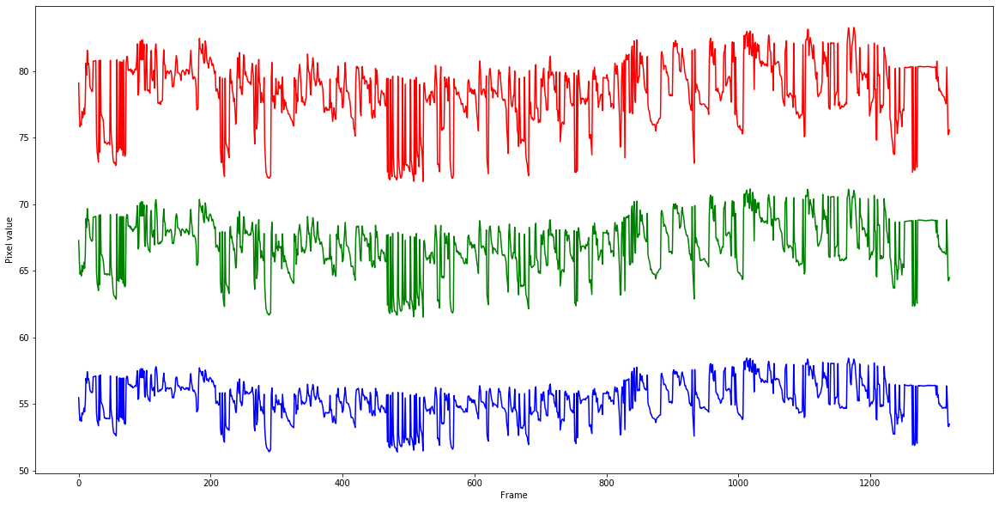

In [55]:
fig, ax = plt.subplots(figsize=(20,10))
data = np.array(ppg)
ax.plot(data[:,0], c="b")
ax.plot(data[:,1], c="g")
ax.plot(data[:,2], c="r")
ax.set_xlabel("Frame")
ax.set_ylabel("Pixel value")

(1321, 3)


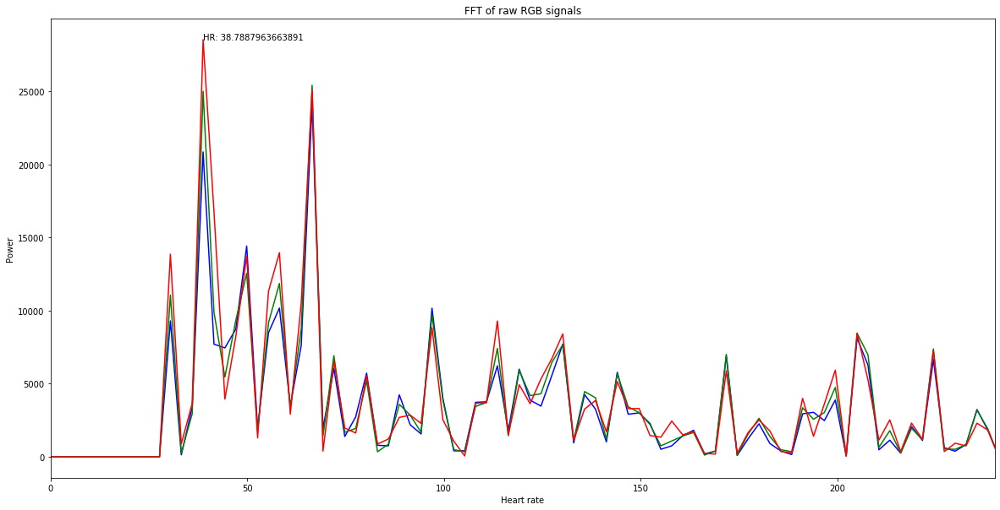

In [56]:
framerate=61.0
fig, ax = plt.subplots(figsize=(20,10))
data = np.array(ppg)
print(data.shape)
freqs = 60*np.fft.rfftfreq(len(data), 1.0/framerate)
band_pass = np.where((freqs < 30) | (freqs > 240) )[0]
color=["b", "g", "r"]

ax.set_xlim(0,240)
max_power = 0
max_heart_rate = 0

for i in range(3):
    x = np.array(ppg)[:,i]
    data = (x-np.mean(x))/np.std(x)
    transform = np.fft.rfft(data)
    transform[band_pass] = 0
    transform = np.abs(transform)**2
    if np.max(transform) > max_power:
        max_power, max_heart_rate = np.max(transform), freqs[np.argmax(transform)]
    ax.plot(freqs, transform, c=color[i])
ax.annotate(f"HR: {max_heart_rate}", (max_heart_rate, max_power))
ax.set_xlabel("Heart rate")
ax.set_ylabel("Power")
ax.title.set_text("FFT of raw RGB signals")

In [222]:
print(ica_processor(ppg[:1200], 30))
print(heart_rate)

45.0
[54.0, 54.0, 54.0, 48.0, 48.0, 48.0, 48.0, 42.00000000000001, 48.0, 72.00000000000001, 42.00000000000001, 42.00000000000001, 60.0, 78.0, 78.0, 78.0, 78.0, 78.0, 162.0, 48.0, 156.0, 156.0, 174.00000000000003, 48.0, 162.0]


### STFT

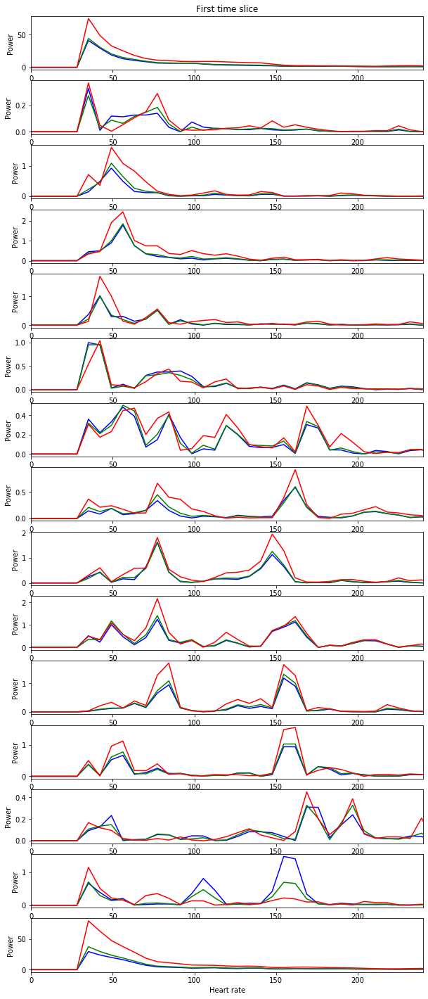

In [215]:
from scipy import signal
data = np.array(ppg)
color = ["b", "g", "r"]
power_spectrum = []
for i in range(3):
    freqs, time, p = signal.stft(data[:,i], 30.0)
    freqs = 60*freqs
    band_pass = np.where((freqs < 30) | (freqs > 240) )[0]
    p[band_pass] = 0
    power_spectrum.append(np.abs(p)**2)
    
power_spectrum = np.array(power_spectrum)
fig, ax = plt.subplots(nrows=len(time), ncols=1,figsize=(10,25))
ax[len(time)-1].set_xlabel("Heart rate")
ax[0].title.set_text("First time slice")
for t in range(len(time)):
    a = ax[t]
    a.sharex = ax[0]
    a.set_xlim(0,240)
    a.set_ylabel("Power")
    max_power = np.max(power_spectrum[:, :, t], axis=None)
    hr_index = np.unravel_index(np.argmax(power_spectrum[:,:,t]), power_spectrum[:,:,t].shape)
    for i in range(3):
        a.plot(freqs, power_spectrum[i, :, t], c=color[i])

plt.savefig("stft.png")

## ICA

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


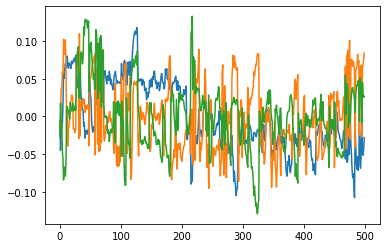

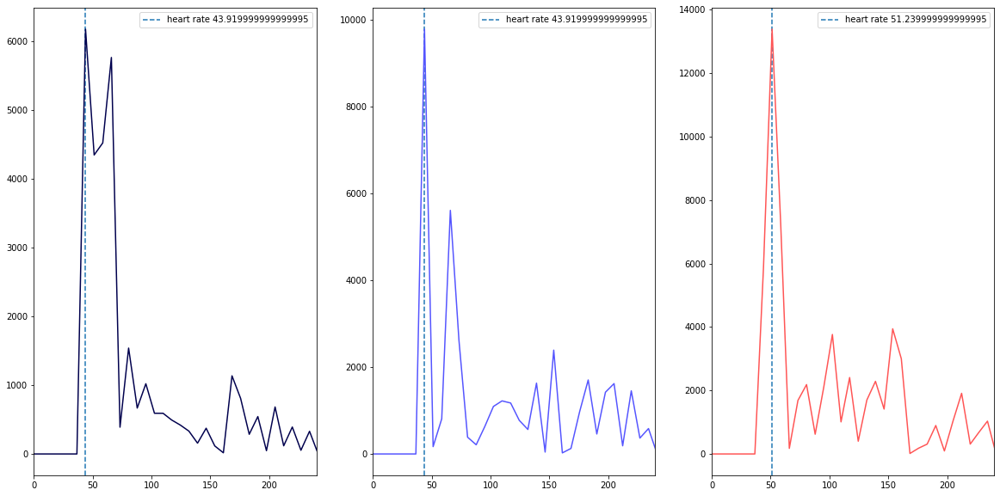

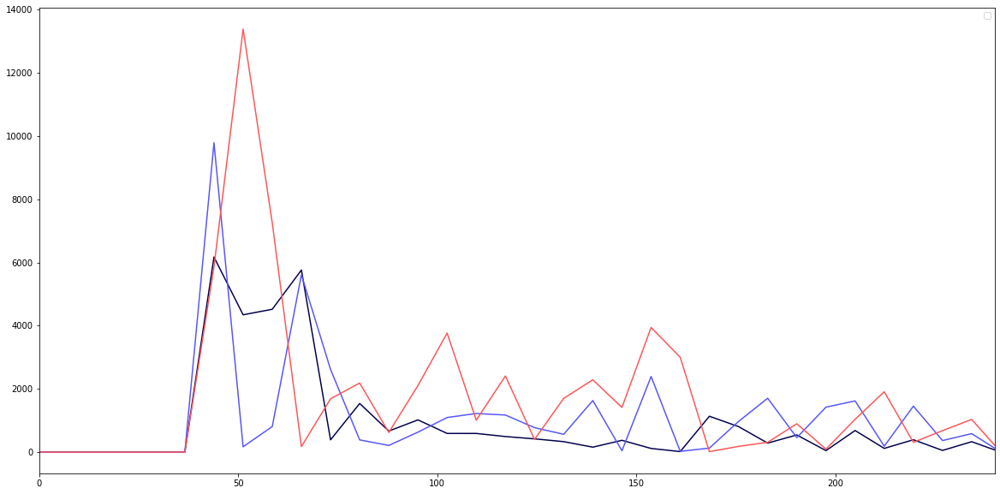

In [54]:
framerate = 61.0
ica = FastICA(n_components=3, max_iter=10000)
data = np.array(ppg[:500])
signals = ica.fit_transform(data)
freqs = 60*np.fft.rfftfreq(len(data), 1.0/framerate)
band_pass = np.where((freqs < 40) | (freqs > 240) )[0]
plt.plot(signals)

titles = ["blue signal", "green signal", "red signal", "fft of blue", "fft of green", "fft of red", 
         "1st ica", "2nd ica", "3rd ica", "fft of 1st ica", "fft of 2nd ica", "fft of 3rd ica"]
cmap = matplotlib.cm.get_cmap('seismic')
cdict = [cmap(i/3) for i in range(3)]
    
fig, ax = plt.subplots(ncols=3, nrows=1, figsize=(20,10))
for i in range(3):
    x = signals[:,i]
    data = (x-np.mean(x))/np.std(x)
    transform = np.fft.rfft(data)
    transform[band_pass] = 0
    transform = np.abs(transform)**2
    id = np.argmax(transform)
    ax[i].axvline(x=freqs[id], label=f"heart rate {freqs[id]}", linestyle='--')
    ax[i].set_xlim(0,240)
    ax[i].plot(freqs, transform, c=cdict[i])
    ax[i].legend()
    
fig, ax = plt.subplots(figsize=(20,10))
for i in range(3):
    x = signals[:,i]
    data = (x-np.mean(x))/np.std(x)
    transform = np.fft.rfft(data)
    transform[band_pass] = 0
    transform = np.abs(transform)**2
    id = np.argmax(transform)
#     ax[i].axvline(x=freqs[id], label=f"heart rate {freqs[id]}", c='red', linestyle='--')
    ax.set_xlim(0,240)
    ax.plot(freqs, transform, c=cdict[i])
    ax.legend()

In [ ]:
start = time.time()
tracking_pipeline(RepeatedDetector(dnn_detector, scale=3), primitive_roi, mean,"test-face-detection-videos/fixed-distance.mp4", ica_processor, display=True )
end = time.time()
print(end-start)

99.62151980400085


In [ ]:
start = time.time()
tracking_pipeline(NaiveKLTBoxing(dnn_detector, scale=3), primitive_roi, mean,"test-face-detection-videos/fixed-distance.mp4", ica_processor, display=True )
end = time.time()
print(end-start)


1/25=4.0%
81.21832036972046


# Evaluating FaceTracking vs FaceDetecting

In [ ]:
def evaluation_pipeline(tracker, video_path, roi=primitive_roi, signal_processor=ica_processor, display=True):
  results = []
  cap = cv.VideoCapture(PATH + video_path)
  width, height = int(cap.get(cv.CAP_PROP_FRAME_WIDTH)), int(cap.get(cv.CAP_PROP_FRAME_HEIGHT))
  visualiser = None
  
  # Stats to record
  frame_number = 0
  false_positives = 0

  if display:
    visualiser = Visualiser(tracker, video_path, roi, signal_processor, cap)
  while(cap.isOpened()):
    ret, frame = cap.read()
    if ret == False:
      cap.release()
      cv.destroyAllWindows()
      break
    face_found = False
    faces, cropped = None, None

    start = time.time()

    while(not(face_found)):
      frame_number += 1      
      faces, frame, cropped = tracker.track(frame)
      if(len(faces) > 0):
        face_found = True
      else:
        ret, frame = cap.read()
        if ret == False:
          cap.release()
          cv.destroyAllWindows()
          break

      end = time.time()
      false_positives += len(faces) - 1

      x,y,w,h = faces[0]
  
      results.append((str(tracker), frame_number, end-start, w*h, (x+w)/2, (y+h)/2))
  
      area_of_interest = roi(cropped)
      area_of_interest = np.pad(area_of_interest, ((y,height-(y+h)),(x,width-(x+w))), 'constant', constant_values=1)
    area_of_interest = np.repeat(area_of_interest[:, :, np.newaxis], 3, axis=2)
      frame = ma.masked_array(frame, mask=area_of_interest)
      if display:
        visualiser.display(frame, faces, area_of_interest)
  return pd.DataFrame(results, columns = ['tracker', 'frame number', 'time to find face', 'size of box', 'centre of box (x)', 'centre of box (y)'])

In [ ]:
cls = ['tracker', 'frame number', 'time to find face', 'size of box', 'centre of box (x)', 'centre of box (y)']
def tracker_vs_detector(video):
  overall_results = pd.DataFrame(columns=cls)
  video_path = f"test-face-detection-videos/{video}"
  video_name = video.split(".")[0]
  trackers = [RepeatedDetector(dnn_detector, scale=3), NaiveKLTBoxing(dnn_detector, scale=3), KLTBoxingWithThresholding(dnn_detector, scale=3)]
  for t in trackers:
    results = evaluation_pipeline(t, video_path)
    overall_results = overall_results.append(results)
  overall_results.to_csv(f"{PATH}output/tracking_vs_detecting_{video_name}.csv")
  return overall_results

## Analysis of Stationary videos

In [ ]:
overall_results = tracker_vs_detector("fixed-distance.mp4")

4/352=1.1363636363636365%


In [ ]:
overall_results = pd.read_csv((f"{PATH}output/tracking_vs_detecting_fixed-distance.csv"))

In [ ]:
data = overall_results.pivot(index='frame number', columns='tracker', values='time to find face')
data.plot(figsize=(10,10))

In [ ]:
data

In [ ]:
data = overall_results.pivot(index='tracker', columns='frame number', values='time to find face')
variance = data.var(axis=1)
data['fps'] = len(data.columns)/data.sum(axis=1)

x_pos = [i for i in range(len(data))]

plt.figure(figsize=(20,10))
plt.bar(x_pos, data['fps'], color='green', yerr=variance)
plt.xlabel("Tracker")
plt.ylabel("Frame per second (FPS)")
plt.title("Performance of the various trackers")

plt.xticks(x_pos, data.index)
plt.show()

In [ ]:
data = overall_results.pivot(index='frame number', columns='tracker', values='size of box')
data.plot(figsize=(10,10))

In [ ]:
data = overall_results.pivot(index='frame number', columns='tracker', values=['centre of box (x)', 'centre of box(y)'])
data.plot(figsize=(10,10))

## Videos with Movement

In [ ]:
movement_results = tracker_vs_detector("VID-2.mp4")

14/458=3.056768558951965%


In [ ]:
movement_results = pd.read_csv(f"{PATH}output/tracking_vs_detecting_VID-2.csv")
movement_results

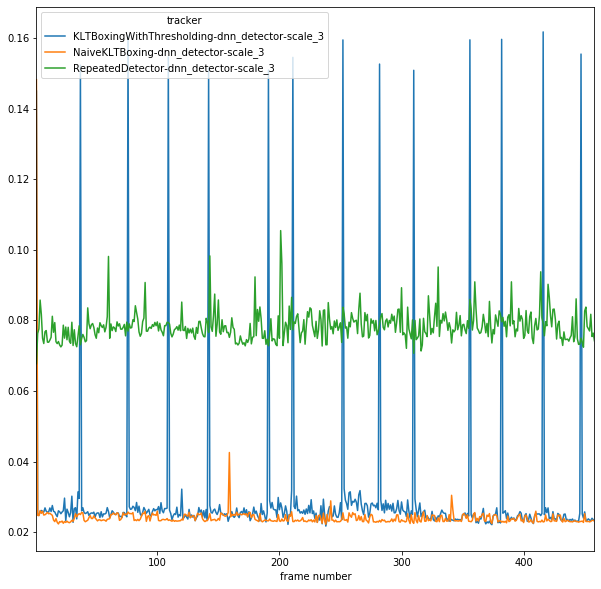

In [ ]:
data = movement_results.pivot(index='frame number', columns='tracker', values='time to find face')
data.plot(figsize=(10,10))

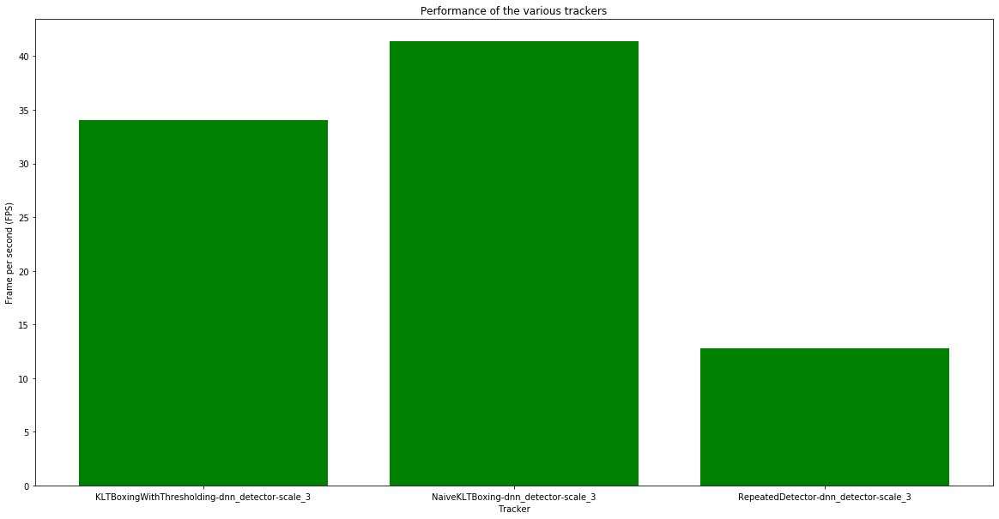

In [ ]:
data = movement_results.pivot(index='tracker', columns='frame number', values='time to find face')
variance = data.var(axis=1)
data['fps'] = len(data.columns)/data.sum(axis=1)

x_pos = [i for i in range(len(data))]

plt.figure(figsize=(20,10))
plt.bar(x_pos, data['fps'], color='green', yerr=variance)
plt.xlabel("Tracker")
plt.ylabel("Frame per second (FPS)")
plt.title("Performance of the various trackers")

plt.xticks(x_pos, data.index)
plt.show()

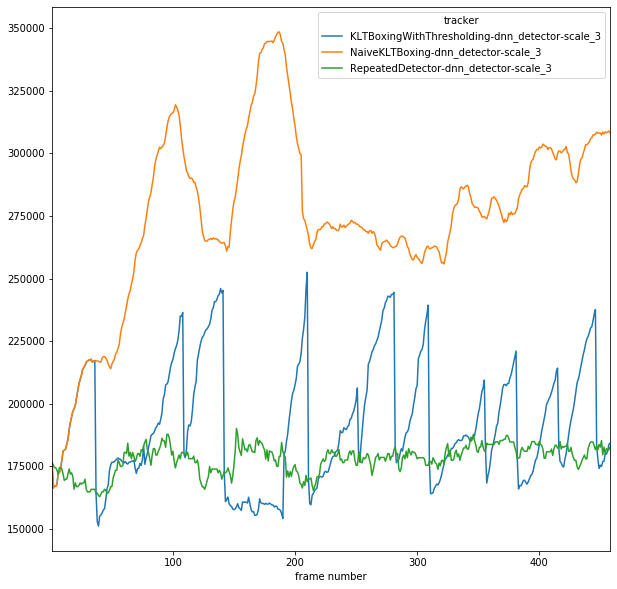

In [ ]:
data = movement_results.pivot(index='frame number', columns='tracker', values='size of box')
data.plot(figsize=(10,10))

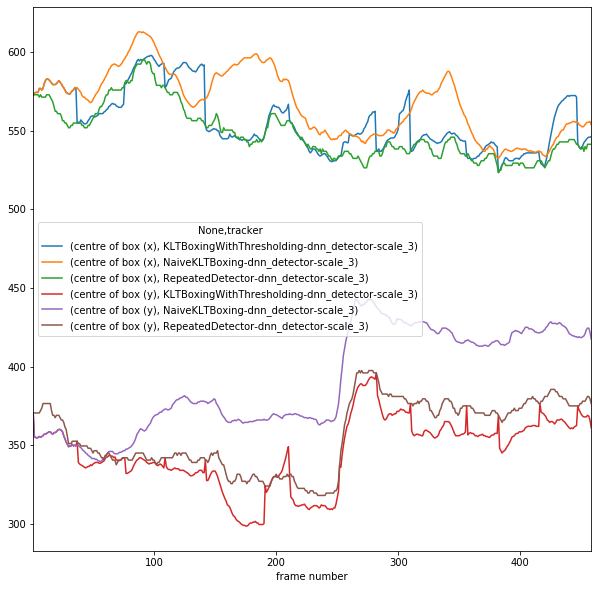

In [ ]:
data = movement_results.pivot(index='frame number', columns='tracker', values=['centre of box (x)', 'centre of box (y)'])
data.plot(figsize=(10,10))

# Mahnob

47
['Fp1', 'AF3', 'F3', 'F7', 'FC5', 'FC1', 'C3', 'T7', 'CP5', 'CP1', 'P3', 'P7', 'PO3', 'O1', 'Oz', 'Pz', 'Fp2', 'AF4', 'Fz', 'F4', 'F8', 'FC6', 'FC2', 'Cz', 'C4', 'T8', 'CP6', 'CP2', 'P4', 'P8', 'PO4', 'O2', 'EXG1', 'EXG2', 'EXG3', 'EXG4', 'EXG5', 'EXG6', 'EXG7', 'EXG8', 'GSR1', 'GSR2', 'Erg1', 'Erg2', 'Resp', 'Temp', 'Status']
256


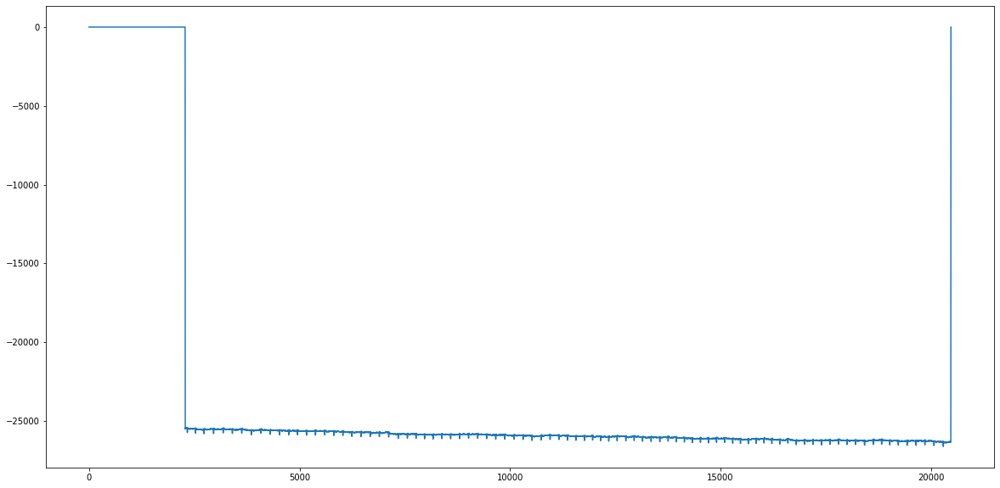

In [13]:
import pyedflib
import numpy as np
file_name = f"{PATH}/mahnob/Part_1_N_Trial1_emotion.bdf"
# file_name = f"{PATH}/mahnob/Part_1_S_Trial2_emotion.bdf"
f = pyedflib.EdfReader(file_name)
n = f.signals_in_file
signal_labels = f.getSignalLabels()
print(n)
print(signal_labels)
ecg = signal_labels.index("EXG1")
# print(ecg)
print(f.getSampleFrequency(ecg))
sigbufs = np.zeros((n, f.getNSamples()[0]))
ecg = f.readSignal(ecg)
fig, ax = plt.subplots(figsize=(20,10))
ax.plot(ecg)
f._close()

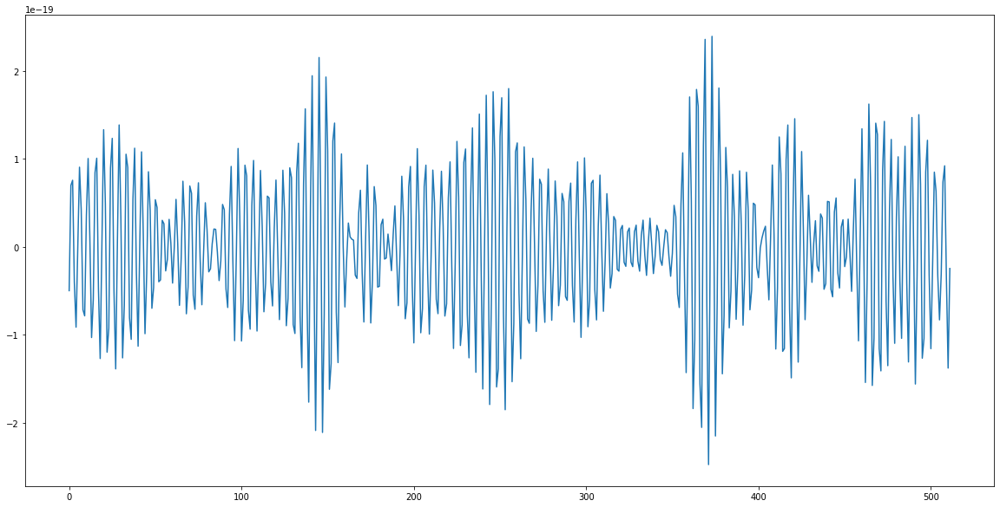

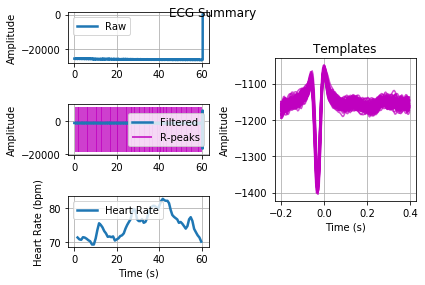

In [15]:
from scipy import signal
fig, ax = plt.subplots(figsize=(20,10))
fs = 256
fc = 10  # Cut-off frequency of the filter
w = fc / (fs / 2) # Normalize the frequency
b, a = signal.butter(5, (0.41, 0.51), 'bandpass')
output = signal.filtfilt(b, a, ecg)
plt.plot(output[:512], label='filtered')

from biosppy import storage
from biosppy.signals import ecg as ECG

# process it and plot
out = ECG.ecg(signal=ecg[5000:], sampling_rate=256., show=True)


(30000,)


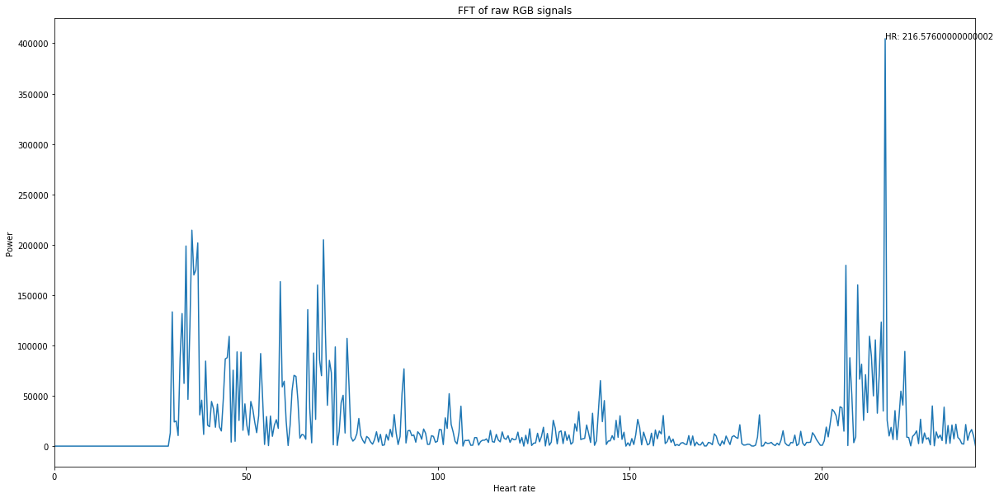

In [71]:
fig, ax = plt.subplots(figsize=(20,10))
data = ecg[:30000]
print(data.shape)
freqs = 60*np.fft.rfftfreq(len(data), 1.0/256)
band_pass = np.where((freqs < 30) | (freqs > 240) )[0]

ax.set_xlim(0,240)
max_power = 0
max_heart_rate = 0

data = (data-np.mean(data))/np.std(data)
transform = np.fft.rfft(data)
transform[band_pass] = 0
transform = np.abs(transform)**2
if np.max(transform) > max_power:
    max_power, max_heart_rate = np.max(transform), freqs[np.argmax(transform)]
ax.plot(freqs, transform)
ax.annotate(f"HR: {max_heart_rate}", (max_heart_rate, max_power))
ax.set_xlabel("Heart rate")
ax.set_ylabel("Power")
ax.title.set_text("FFT of raw RGB signals")

(30000,)


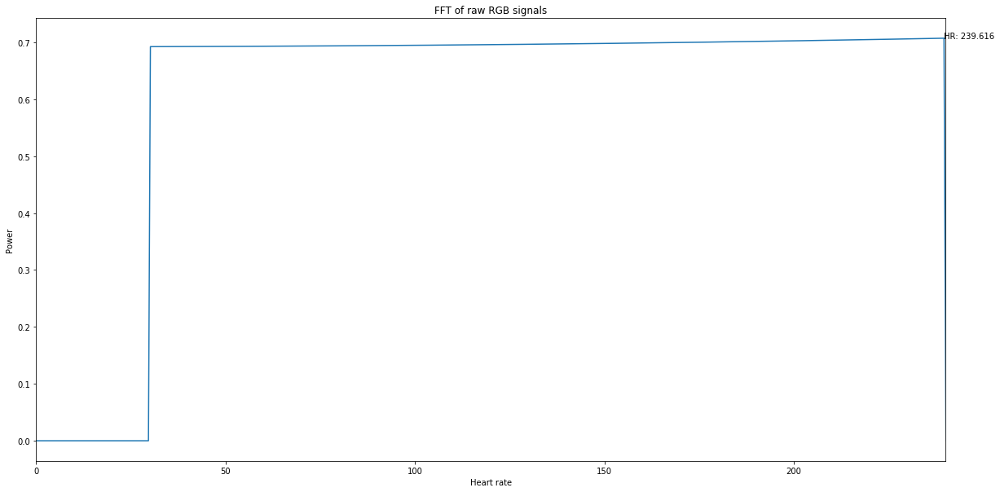

In [73]:
fig, ax = plt.subplots(figsize=(20,10))
data = output[:30000]
print(data.shape)
freqs = 60*np.fft.rfftfreq(len(data), 1.0/256)
band_pass = np.where((freqs < 30) | (freqs > 240) )[0]

ax.set_xlim(0,240)
max_power = 0
max_heart_rate = 0

data = (data-np.mean(data))/np.std(data)
transform = np.fft.rfft(data)
transform[band_pass] = 0
transform = np.abs(transform)**2
if np.max(transform) > max_power:
    max_power, max_heart_rate = np.max(transform), freqs[np.argmax(transform)]
ax.plot(freqs, transform)
ax.annotate(f"HR: {max_heart_rate}", (max_heart_rate, max_power))
ax.set_xlabel("Heart rate")
ax.set_ylabel("Power")
ax.title.set_text("FFT of raw RGB signals")

In [49]:
video = "mahnob/P1-Rec1-2009.07.09.17.53.46_C1 trigger _C_Section_1.avi"
start = Timing.time()
ppg, heart_rate = tracking_pipeline(KLTBoxingWithThresholding(dnn_detector, scale=3), primitive_roi, mean, video, ica_processor)
e = file.split(".")[0]
np.savetxt(f"{PATH}/output/ppg/{file_name}-ppg.csv", ppg, delimiter=",")
end = Timing.time()
print(end-start)

1/1=100.0%
N: 1, Frame number: 960
N: 2, Frame number: 1020
N: 3, Frame number: 1080
N: 4, Frame number: 1140
N: 5, Frame number: 1200
N: 6, Frame number: 1260
N: 7, Frame number: 1320
200/1321=15.14004542013626%


NameError: name 'file' is not defined

In [50]:

np.savetxt(f"{PATH}/output/ppg/p1-ppg.csv", ppg, delimiter=",")

In [51]:
print(heart_rate)

[40.666666666666664, 40.666666666666664, 56.93333333333333, 56.93333333333333, 56.93333333333333, 56.93333333333333, 40.666666666666664, 40.666666666666664]
